# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 46kB/s eta 0:00:011
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 18.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

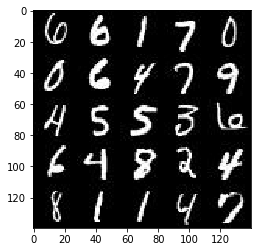

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

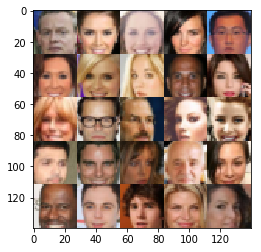

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, shape = (None, image_width, image_height, image_channels), name='input_real')
    z = tf.placeholder(tf.float32, shape = (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32,name='learning_rate')
    

    return real_input, z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 497, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/tornado/ioloop.py", line 832, in start\n    self._run_callback(self._callbacks.popleft())', 'File

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [65]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(.1*x1, x1)

        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        d2 = tf.layers.dropout(bn2, rate = .5)
        relu2 = tf.maximum(.1*d2, d2)
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        d3 = tf.layers.dropout(bn3, rate=.5)
        relu3 = tf.maximum(.1*d3, d3)
        
        flat = tf.contrib.layers.flatten(relu3)
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [66]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse= not is_train):
        x1 = tf.layers.dense(z, 7*7*256)
        x1 = tf.reshape(x1, (-1, 7,7,256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        relu1 = tf.maximum(.2*x1, x1)
        
        x2 = tf.layers.conv2d_transpose(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        relu2 = tf.maximum(.2*bn2, bn2)

        x3 = tf.layers.conv2d_transpose(relu2, 64, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        relu3 = tf.maximum(.2*bn3, bn3)

        x4 = tf.layers.conv2d_transpose(relu3, 32, 5, strides=1, padding='same')
        bn4 = tf.layers.batch_normalization(x4, training=is_train)
        relu4 = tf.maximum(.2*bn4, bn4)

        logits = tf.layers.conv2d_transpose(relu4, out_channel_dim, 3, strides=1, padding='same')
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [67]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = 0.1
    
    g_model = generator(input_z, out_channel_dim)
    d_out_real, d_real = discriminator(input_real, reuse=False)
    d_out_fake, d_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_real, labels=tf.ones_like(d_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_fake, labels=tf.zeros_like(d_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_fake, labels=tf.ones_like(d_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [68]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [69]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [70]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    saver = tf.train.Saver()
    losses = []
    steps = 0
    print_every=10
    show_every = 100

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps+=1
                
                batch_images *= 2 # To bring real batch same scale as tanh output
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z, 
                                                     lr: learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z, input_real: batch_images, 
                                                     lr: learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
        saver.save(sess, './generator.ckpt')
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 1.3640... Generator Loss: 1.0523
Epoch 1/2... Discriminator Loss: 1.2239... Generator Loss: 1.1014
Epoch 1/2... Discriminator Loss: 1.6840... Generator Loss: 4.6378
Epoch 1/2... Discriminator Loss: 1.7512... Generator Loss: 0.8465
Epoch 1/2... Discriminator Loss: 1.7147... Generator Loss: 1.0686
Epoch 1/2... Discriminator Loss: 1.7557... Generator Loss: 0.8556
Epoch 1/2... Discriminator Loss: 1.4394... Generator Loss: 0.8548
Epoch 1/2... Discriminator Loss: 1.4702... Generator Loss: 0.8443
Epoch 1/2... Discriminator Loss: 1.3814... Generator Loss: 0.6618
Epoch 1/2... Discriminator Loss: 1.6075... Generator Loss: 1.0459


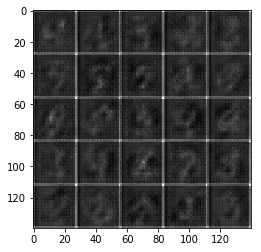

Epoch 1/2... Discriminator Loss: 1.5741... Generator Loss: 1.0658
Epoch 1/2... Discriminator Loss: 1.4382... Generator Loss: 0.7531
Epoch 1/2... Discriminator Loss: 1.4798... Generator Loss: 1.1901
Epoch 1/2... Discriminator Loss: 1.4111... Generator Loss: 0.6028
Epoch 1/2... Discriminator Loss: 1.6232... Generator Loss: 1.5548
Epoch 1/2... Discriminator Loss: 1.5294... Generator Loss: 0.4426
Epoch 1/2... Discriminator Loss: 1.4886... Generator Loss: 0.4956
Epoch 1/2... Discriminator Loss: 1.5952... Generator Loss: 1.5725
Epoch 1/2... Discriminator Loss: 1.8060... Generator Loss: 0.2867
Epoch 1/2... Discriminator Loss: 1.9042... Generator Loss: 0.2497


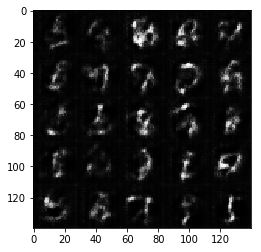

Epoch 1/2... Discriminator Loss: 1.4080... Generator Loss: 0.5175
Epoch 1/2... Discriminator Loss: 1.5136... Generator Loss: 1.3402
Epoch 1/2... Discriminator Loss: 1.4846... Generator Loss: 0.6185
Epoch 1/2... Discriminator Loss: 2.0619... Generator Loss: 0.2322
Epoch 1/2... Discriminator Loss: 1.3379... Generator Loss: 0.6418
Epoch 1/2... Discriminator Loss: 1.6599... Generator Loss: 0.3587
Epoch 1/2... Discriminator Loss: 1.2504... Generator Loss: 1.1104
Epoch 1/2... Discriminator Loss: 1.3660... Generator Loss: 1.3992
Epoch 1/2... Discriminator Loss: 1.3814... Generator Loss: 0.5683
Epoch 1/2... Discriminator Loss: 1.3716... Generator Loss: 0.6345


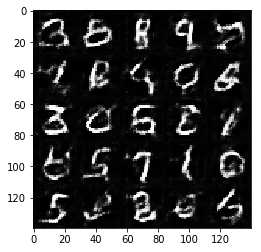

Epoch 1/2... Discriminator Loss: 1.2886... Generator Loss: 0.7771
Epoch 1/2... Discriminator Loss: 1.3399... Generator Loss: 0.6447
Epoch 1/2... Discriminator Loss: 1.2911... Generator Loss: 1.4581
Epoch 1/2... Discriminator Loss: 1.7682... Generator Loss: 0.3312
Epoch 1/2... Discriminator Loss: 1.4271... Generator Loss: 1.0671
Epoch 1/2... Discriminator Loss: 1.4221... Generator Loss: 0.4865
Epoch 1/2... Discriminator Loss: 1.2416... Generator Loss: 0.9355
Epoch 1/2... Discriminator Loss: 1.5985... Generator Loss: 0.3830
Epoch 1/2... Discriminator Loss: 1.1319... Generator Loss: 1.2302
Epoch 1/2... Discriminator Loss: 1.3646... Generator Loss: 0.7112


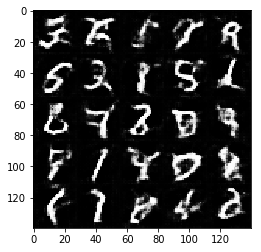

Epoch 1/2... Discriminator Loss: 1.5345... Generator Loss: 0.4032
Epoch 1/2... Discriminator Loss: 1.2959... Generator Loss: 0.6969
Epoch 1/2... Discriminator Loss: 1.2604... Generator Loss: 1.1534
Epoch 1/2... Discriminator Loss: 1.4238... Generator Loss: 1.7799
Epoch 1/2... Discriminator Loss: 1.3329... Generator Loss: 0.6515
Epoch 1/2... Discriminator Loss: 1.1764... Generator Loss: 1.2925
Epoch 1/2... Discriminator Loss: 1.2219... Generator Loss: 0.7673
Epoch 1/2... Discriminator Loss: 1.6567... Generator Loss: 0.4386
Epoch 1/2... Discriminator Loss: 1.2044... Generator Loss: 1.0168
Epoch 1/2... Discriminator Loss: 1.2416... Generator Loss: 1.2018


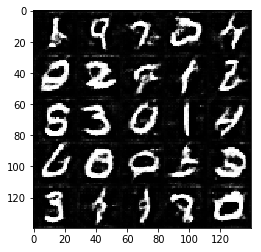

Epoch 1/2... Discriminator Loss: 1.5303... Generator Loss: 0.4160
Epoch 1/2... Discriminator Loss: 1.3172... Generator Loss: 0.7867
Epoch 1/2... Discriminator Loss: 1.0696... Generator Loss: 1.0422
Epoch 1/2... Discriminator Loss: 1.3272... Generator Loss: 0.5999
Epoch 1/2... Discriminator Loss: 1.1440... Generator Loss: 1.0340
Epoch 1/2... Discriminator Loss: 1.4803... Generator Loss: 1.8249
Epoch 1/2... Discriminator Loss: 1.4775... Generator Loss: 0.4563
Epoch 1/2... Discriminator Loss: 1.1382... Generator Loss: 0.9839
Epoch 1/2... Discriminator Loss: 1.6984... Generator Loss: 0.3896
Epoch 1/2... Discriminator Loss: 1.1276... Generator Loss: 1.2820


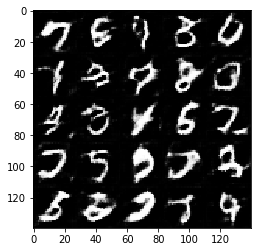

Epoch 1/2... Discriminator Loss: 1.2591... Generator Loss: 0.6630
Epoch 1/2... Discriminator Loss: 1.2678... Generator Loss: 0.6534
Epoch 1/2... Discriminator Loss: 1.4676... Generator Loss: 1.3953
Epoch 1/2... Discriminator Loss: 1.2182... Generator Loss: 0.7476
Epoch 1/2... Discriminator Loss: 1.6424... Generator Loss: 0.3422
Epoch 1/2... Discriminator Loss: 1.4244... Generator Loss: 0.5266
Epoch 1/2... Discriminator Loss: 1.2010... Generator Loss: 1.3382
Epoch 1/2... Discriminator Loss: 1.2643... Generator Loss: 1.3441
Epoch 1/2... Discriminator Loss: 1.5189... Generator Loss: 0.4312
Epoch 1/2... Discriminator Loss: 0.9700... Generator Loss: 1.3746


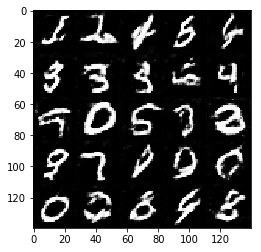

Epoch 1/2... Discriminator Loss: 1.2380... Generator Loss: 0.8960
Epoch 1/2... Discriminator Loss: 1.2778... Generator Loss: 0.6354
Epoch 1/2... Discriminator Loss: 1.0047... Generator Loss: 1.4841
Epoch 1/2... Discriminator Loss: 1.3597... Generator Loss: 0.6193
Epoch 1/2... Discriminator Loss: 1.1372... Generator Loss: 0.7893
Epoch 1/2... Discriminator Loss: 1.3105... Generator Loss: 0.8386
Epoch 1/2... Discriminator Loss: 1.1398... Generator Loss: 1.0056
Epoch 1/2... Discriminator Loss: 0.9954... Generator Loss: 1.3273
Epoch 1/2... Discriminator Loss: 1.0800... Generator Loss: 1.3992
Epoch 1/2... Discriminator Loss: 1.0881... Generator Loss: 1.2598


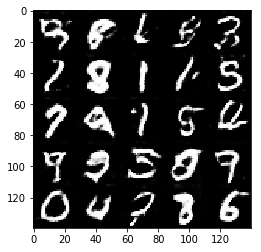

Epoch 1/2... Discriminator Loss: 1.1967... Generator Loss: 0.7588
Epoch 1/2... Discriminator Loss: 1.2804... Generator Loss: 0.6080
Epoch 1/2... Discriminator Loss: 1.2098... Generator Loss: 0.8977
Epoch 1/2... Discriminator Loss: 1.4229... Generator Loss: 0.5054
Epoch 1/2... Discriminator Loss: 1.0435... Generator Loss: 0.9111
Epoch 1/2... Discriminator Loss: 1.5553... Generator Loss: 0.3957
Epoch 1/2... Discriminator Loss: 1.1120... Generator Loss: 0.9895
Epoch 1/2... Discriminator Loss: 1.4466... Generator Loss: 0.5024
Epoch 1/2... Discriminator Loss: 1.2651... Generator Loss: 0.6248
Epoch 1/2... Discriminator Loss: 1.1400... Generator Loss: 0.8875


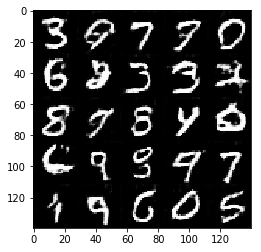

Epoch 1/2... Discriminator Loss: 1.1187... Generator Loss: 0.9037
Epoch 1/2... Discriminator Loss: 1.0407... Generator Loss: 1.6375
Epoch 1/2... Discriminator Loss: 1.0170... Generator Loss: 1.0082
Epoch 1/2... Discriminator Loss: 1.3597... Generator Loss: 0.6326
Epoch 1/2... Discriminator Loss: 1.4262... Generator Loss: 0.5545
Epoch 1/2... Discriminator Loss: 1.0622... Generator Loss: 1.3022
Epoch 1/2... Discriminator Loss: 1.1323... Generator Loss: 0.8134
Epoch 1/2... Discriminator Loss: 1.1105... Generator Loss: 0.7839
Epoch 1/2... Discriminator Loss: 1.1100... Generator Loss: 1.1647
Epoch 1/2... Discriminator Loss: 1.7888... Generator Loss: 0.3216


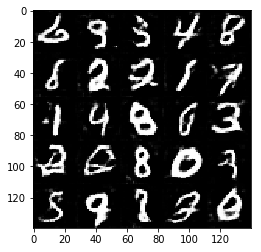

Epoch 1/2... Discriminator Loss: 1.0943... Generator Loss: 0.8026
Epoch 1/2... Discriminator Loss: 1.7028... Generator Loss: 0.4089
Epoch 1/2... Discriminator Loss: 1.2642... Generator Loss: 0.6522
Epoch 1/2... Discriminator Loss: 1.1526... Generator Loss: 0.9467
Epoch 1/2... Discriminator Loss: 1.1413... Generator Loss: 0.7887
Epoch 1/2... Discriminator Loss: 1.1756... Generator Loss: 1.4681
Epoch 1/2... Discriminator Loss: 1.7535... Generator Loss: 1.9000
Epoch 1/2... Discriminator Loss: 1.0742... Generator Loss: 0.9753
Epoch 1/2... Discriminator Loss: 1.2770... Generator Loss: 0.5804
Epoch 1/2... Discriminator Loss: 1.3213... Generator Loss: 0.5931


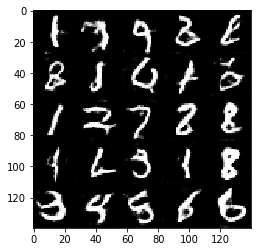

Epoch 1/2... Discriminator Loss: 1.2730... Generator Loss: 0.6539
Epoch 1/2... Discriminator Loss: 1.3589... Generator Loss: 1.6607
Epoch 1/2... Discriminator Loss: 1.0393... Generator Loss: 1.0125
Epoch 1/2... Discriminator Loss: 1.1510... Generator Loss: 0.7830
Epoch 1/2... Discriminator Loss: 0.8765... Generator Loss: 1.3744
Epoch 1/2... Discriminator Loss: 1.2793... Generator Loss: 0.6329
Epoch 1/2... Discriminator Loss: 1.2074... Generator Loss: 0.6190
Epoch 1/2... Discriminator Loss: 0.9532... Generator Loss: 1.5120
Epoch 1/2... Discriminator Loss: 1.1504... Generator Loss: 1.2079
Epoch 1/2... Discriminator Loss: 1.0122... Generator Loss: 0.8769


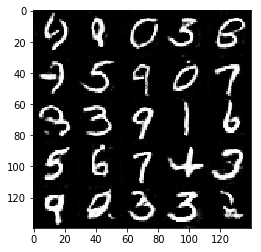

Epoch 1/2... Discriminator Loss: 1.0590... Generator Loss: 0.9872
Epoch 1/2... Discriminator Loss: 1.1457... Generator Loss: 1.0025
Epoch 1/2... Discriminator Loss: 1.1140... Generator Loss: 0.7988
Epoch 1/2... Discriminator Loss: 1.1051... Generator Loss: 1.4100
Epoch 1/2... Discriminator Loss: 1.1504... Generator Loss: 0.7128
Epoch 1/2... Discriminator Loss: 1.1816... Generator Loss: 0.6806
Epoch 1/2... Discriminator Loss: 1.0021... Generator Loss: 0.9654
Epoch 1/2... Discriminator Loss: 1.0910... Generator Loss: 0.8434
Epoch 1/2... Discriminator Loss: 1.2185... Generator Loss: 0.6445
Epoch 1/2... Discriminator Loss: 1.1101... Generator Loss: 1.7510


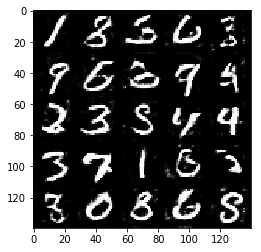

Epoch 1/2... Discriminator Loss: 1.0868... Generator Loss: 1.0676
Epoch 1/2... Discriminator Loss: 1.2827... Generator Loss: 0.6042
Epoch 1/2... Discriminator Loss: 1.0475... Generator Loss: 1.4363
Epoch 1/2... Discriminator Loss: 1.2772... Generator Loss: 0.5708
Epoch 1/2... Discriminator Loss: 1.2753... Generator Loss: 0.7386
Epoch 1/2... Discriminator Loss: 1.5821... Generator Loss: 0.4362
Epoch 1/2... Discriminator Loss: 1.2515... Generator Loss: 1.8341
Epoch 1/2... Discriminator Loss: 0.9571... Generator Loss: 1.2642
Epoch 1/2... Discriminator Loss: 1.0767... Generator Loss: 0.8647
Epoch 1/2... Discriminator Loss: 1.2191... Generator Loss: 0.7030


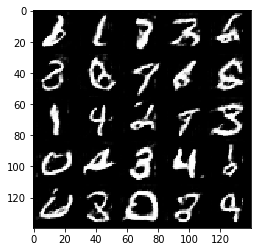

Epoch 1/2... Discriminator Loss: 1.1278... Generator Loss: 0.7136
Epoch 1/2... Discriminator Loss: 1.3284... Generator Loss: 1.5868
Epoch 1/2... Discriminator Loss: 0.9541... Generator Loss: 1.3669
Epoch 1/2... Discriminator Loss: 1.0748... Generator Loss: 0.9005
Epoch 1/2... Discriminator Loss: 1.5650... Generator Loss: 2.9285
Epoch 1/2... Discriminator Loss: 1.5118... Generator Loss: 0.4192
Epoch 1/2... Discriminator Loss: 1.2504... Generator Loss: 0.6858
Epoch 1/2... Discriminator Loss: 1.0943... Generator Loss: 0.7649
Epoch 1/2... Discriminator Loss: 1.0984... Generator Loss: 1.4486
Epoch 1/2... Discriminator Loss: 1.3003... Generator Loss: 0.5595


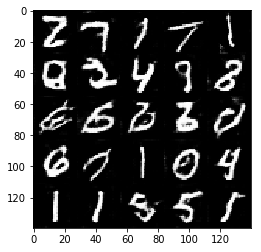

Epoch 1/2... Discriminator Loss: 1.0579... Generator Loss: 1.5199
Epoch 1/2... Discriminator Loss: 1.0838... Generator Loss: 0.7506
Epoch 1/2... Discriminator Loss: 1.5873... Generator Loss: 0.4220
Epoch 1/2... Discriminator Loss: 1.2580... Generator Loss: 0.5941
Epoch 1/2... Discriminator Loss: 1.0393... Generator Loss: 0.8075
Epoch 1/2... Discriminator Loss: 1.5091... Generator Loss: 0.4622
Epoch 1/2... Discriminator Loss: 1.0180... Generator Loss: 0.8626
Epoch 1/2... Discriminator Loss: 1.5497... Generator Loss: 0.4120
Epoch 1/2... Discriminator Loss: 0.9794... Generator Loss: 1.0361
Epoch 1/2... Discriminator Loss: 1.1015... Generator Loss: 1.6706


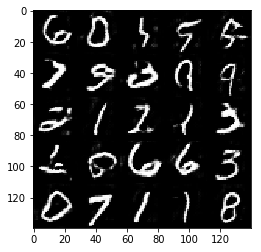

Epoch 1/2... Discriminator Loss: 1.1541... Generator Loss: 1.3457
Epoch 1/2... Discriminator Loss: 1.5006... Generator Loss: 2.0811
Epoch 1/2... Discriminator Loss: 1.6791... Generator Loss: 0.3505
Epoch 1/2... Discriminator Loss: 1.1580... Generator Loss: 1.5677
Epoch 1/2... Discriminator Loss: 1.1841... Generator Loss: 1.7637
Epoch 1/2... Discriminator Loss: 0.8821... Generator Loss: 1.5535
Epoch 1/2... Discriminator Loss: 1.5882... Generator Loss: 0.4870
Epoch 1/2... Discriminator Loss: 1.0439... Generator Loss: 1.2410
Epoch 1/2... Discriminator Loss: 1.0012... Generator Loss: 1.0964
Epoch 1/2... Discriminator Loss: 1.1619... Generator Loss: 0.7033


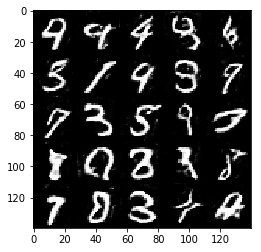

Epoch 1/2... Discriminator Loss: 1.4761... Generator Loss: 0.4577
Epoch 1/2... Discriminator Loss: 0.8856... Generator Loss: 1.1341
Epoch 1/2... Discriminator Loss: 0.8754... Generator Loss: 1.3084
Epoch 1/2... Discriminator Loss: 1.5337... Generator Loss: 0.4307
Epoch 1/2... Discriminator Loss: 0.9224... Generator Loss: 1.1553
Epoch 1/2... Discriminator Loss: 0.9359... Generator Loss: 1.3422
Epoch 1/2... Discriminator Loss: 1.2407... Generator Loss: 0.6368
Epoch 1/2... Discriminator Loss: 1.3757... Generator Loss: 0.5333
Epoch 1/2... Discriminator Loss: 1.2391... Generator Loss: 0.6470
Epoch 1/2... Discriminator Loss: 1.0365... Generator Loss: 1.1145


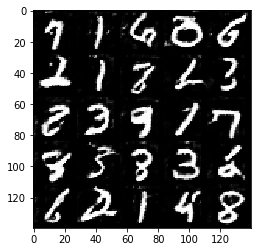

Epoch 1/2... Discriminator Loss: 1.6436... Generator Loss: 0.4130
Epoch 1/2... Discriminator Loss: 1.3751... Generator Loss: 2.5698
Epoch 1/2... Discriminator Loss: 0.9876... Generator Loss: 1.1654
Epoch 1/2... Discriminator Loss: 1.3556... Generator Loss: 0.5236
Epoch 1/2... Discriminator Loss: 1.2278... Generator Loss: 0.7711
Epoch 1/2... Discriminator Loss: 1.4735... Generator Loss: 0.4325
Epoch 1/2... Discriminator Loss: 1.0974... Generator Loss: 0.9468
Epoch 2/2... Discriminator Loss: 1.0580... Generator Loss: 1.8544
Epoch 2/2... Discriminator Loss: 0.9680... Generator Loss: 0.9171
Epoch 2/2... Discriminator Loss: 1.6230... Generator Loss: 0.3774


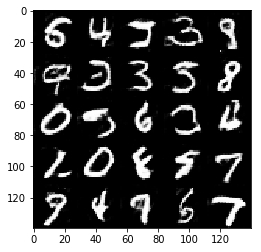

Epoch 2/2... Discriminator Loss: 0.9133... Generator Loss: 1.1890
Epoch 2/2... Discriminator Loss: 1.3723... Generator Loss: 0.6104
Epoch 2/2... Discriminator Loss: 1.4610... Generator Loss: 0.4751
Epoch 2/2... Discriminator Loss: 1.1195... Generator Loss: 0.9177
Epoch 2/2... Discriminator Loss: 0.8818... Generator Loss: 1.1471
Epoch 2/2... Discriminator Loss: 1.0943... Generator Loss: 0.8251
Epoch 2/2... Discriminator Loss: 2.0215... Generator Loss: 0.2543
Epoch 2/2... Discriminator Loss: 1.2921... Generator Loss: 0.5856
Epoch 2/2... Discriminator Loss: 1.6113... Generator Loss: 0.4170
Epoch 2/2... Discriminator Loss: 1.0767... Generator Loss: 1.7846


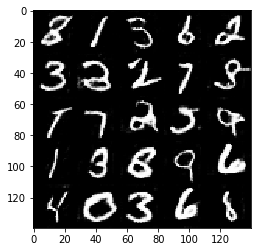

Epoch 2/2... Discriminator Loss: 0.9092... Generator Loss: 0.9529
Epoch 2/2... Discriminator Loss: 1.0837... Generator Loss: 1.7278
Epoch 2/2... Discriminator Loss: 1.0337... Generator Loss: 1.1242
Epoch 2/2... Discriminator Loss: 1.1505... Generator Loss: 0.9890
Epoch 2/2... Discriminator Loss: 0.9813... Generator Loss: 0.9209
Epoch 2/2... Discriminator Loss: 1.4345... Generator Loss: 0.5370
Epoch 2/2... Discriminator Loss: 1.3369... Generator Loss: 0.6195
Epoch 2/2... Discriminator Loss: 1.2951... Generator Loss: 2.1516
Epoch 2/2... Discriminator Loss: 1.0933... Generator Loss: 0.8420
Epoch 2/2... Discriminator Loss: 1.1505... Generator Loss: 0.6939


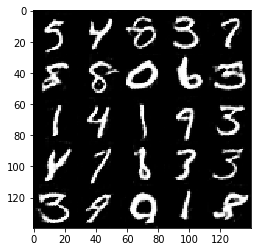

Epoch 2/2... Discriminator Loss: 0.9244... Generator Loss: 1.5685
Epoch 2/2... Discriminator Loss: 1.4870... Generator Loss: 0.5025
Epoch 2/2... Discriminator Loss: 1.1374... Generator Loss: 0.9657
Epoch 2/2... Discriminator Loss: 1.2126... Generator Loss: 0.6529
Epoch 2/2... Discriminator Loss: 1.6493... Generator Loss: 0.3927
Epoch 2/2... Discriminator Loss: 1.0113... Generator Loss: 0.9186
Epoch 2/2... Discriminator Loss: 1.0357... Generator Loss: 1.3187
Epoch 2/2... Discriminator Loss: 1.0552... Generator Loss: 1.0938
Epoch 2/2... Discriminator Loss: 1.1085... Generator Loss: 1.7671
Epoch 2/2... Discriminator Loss: 1.6116... Generator Loss: 0.3850


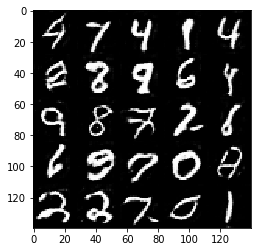

Epoch 2/2... Discriminator Loss: 1.3927... Generator Loss: 0.5136
Epoch 2/2... Discriminator Loss: 0.9891... Generator Loss: 1.2933
Epoch 2/2... Discriminator Loss: 1.3648... Generator Loss: 0.5304
Epoch 2/2... Discriminator Loss: 1.3551... Generator Loss: 0.5376
Epoch 2/2... Discriminator Loss: 0.9759... Generator Loss: 0.9972
Epoch 2/2... Discriminator Loss: 1.3623... Generator Loss: 0.5636
Epoch 2/2... Discriminator Loss: 1.1269... Generator Loss: 0.7452
Epoch 2/2... Discriminator Loss: 1.6815... Generator Loss: 0.3428
Epoch 2/2... Discriminator Loss: 1.5079... Generator Loss: 0.4686
Epoch 2/2... Discriminator Loss: 1.0848... Generator Loss: 0.9363


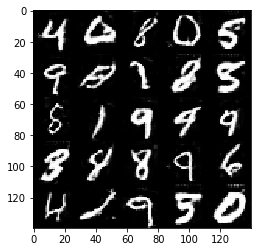

Epoch 2/2... Discriminator Loss: 0.9533... Generator Loss: 1.2390
Epoch 2/2... Discriminator Loss: 1.0645... Generator Loss: 1.0312
Epoch 2/2... Discriminator Loss: 1.0916... Generator Loss: 0.7959
Epoch 2/2... Discriminator Loss: 1.2558... Generator Loss: 0.7120
Epoch 2/2... Discriminator Loss: 1.2207... Generator Loss: 0.6730
Epoch 2/2... Discriminator Loss: 0.8531... Generator Loss: 1.1559
Epoch 2/2... Discriminator Loss: 1.1400... Generator Loss: 0.8107
Epoch 2/2... Discriminator Loss: 0.7720... Generator Loss: 1.4182
Epoch 2/2... Discriminator Loss: 1.0073... Generator Loss: 1.0063
Epoch 2/2... Discriminator Loss: 0.9292... Generator Loss: 1.0437


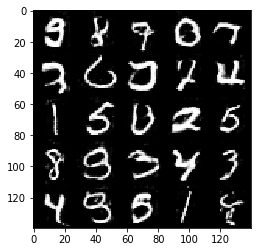

Epoch 2/2... Discriminator Loss: 1.3514... Generator Loss: 0.6196
Epoch 2/2... Discriminator Loss: 1.8479... Generator Loss: 0.3118
Epoch 2/2... Discriminator Loss: 0.9960... Generator Loss: 0.8431
Epoch 2/2... Discriminator Loss: 1.1091... Generator Loss: 0.8962
Epoch 2/2... Discriminator Loss: 1.2060... Generator Loss: 0.6426
Epoch 2/2... Discriminator Loss: 0.9088... Generator Loss: 1.2772
Epoch 2/2... Discriminator Loss: 0.9593... Generator Loss: 1.0387
Epoch 2/2... Discriminator Loss: 1.2449... Generator Loss: 0.6408
Epoch 2/2... Discriminator Loss: 1.5886... Generator Loss: 0.4419
Epoch 2/2... Discriminator Loss: 1.2242... Generator Loss: 0.5986


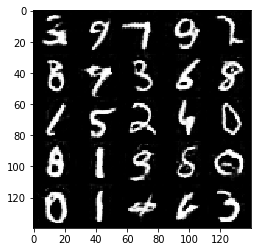

Epoch 2/2... Discriminator Loss: 1.1443... Generator Loss: 0.9448
Epoch 2/2... Discriminator Loss: 1.5497... Generator Loss: 0.4227
Epoch 2/2... Discriminator Loss: 1.0458... Generator Loss: 0.9424
Epoch 2/2... Discriminator Loss: 0.9519... Generator Loss: 1.3944
Epoch 2/2... Discriminator Loss: 0.8512... Generator Loss: 1.2578
Epoch 2/2... Discriminator Loss: 1.3385... Generator Loss: 0.5056
Epoch 2/2... Discriminator Loss: 1.0441... Generator Loss: 0.8218
Epoch 2/2... Discriminator Loss: 1.1001... Generator Loss: 0.7787
Epoch 2/2... Discriminator Loss: 0.9264... Generator Loss: 1.0795
Epoch 2/2... Discriminator Loss: 1.3207... Generator Loss: 1.7037


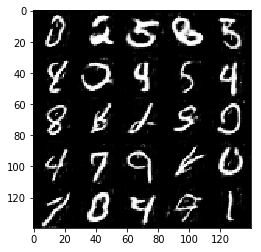

Epoch 2/2... Discriminator Loss: 1.0407... Generator Loss: 1.0402
Epoch 2/2... Discriminator Loss: 1.4043... Generator Loss: 0.5211
Epoch 2/2... Discriminator Loss: 1.1778... Generator Loss: 0.7007
Epoch 2/2... Discriminator Loss: 1.3980... Generator Loss: 1.9100
Epoch 2/2... Discriminator Loss: 1.4696... Generator Loss: 0.6365
Epoch 2/2... Discriminator Loss: 1.0621... Generator Loss: 0.9086
Epoch 2/2... Discriminator Loss: 1.4727... Generator Loss: 0.4961
Epoch 2/2... Discriminator Loss: 1.1683... Generator Loss: 0.7041
Epoch 2/2... Discriminator Loss: 1.1434... Generator Loss: 1.9926
Epoch 2/2... Discriminator Loss: 0.8707... Generator Loss: 1.3105


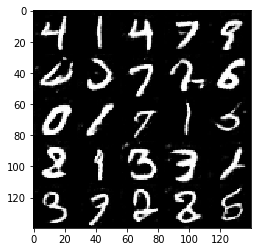

Epoch 2/2... Discriminator Loss: 1.0498... Generator Loss: 0.8154
Epoch 2/2... Discriminator Loss: 1.5056... Generator Loss: 0.4231
Epoch 2/2... Discriminator Loss: 0.9403... Generator Loss: 1.5737
Epoch 2/2... Discriminator Loss: 0.8420... Generator Loss: 1.2742
Epoch 2/2... Discriminator Loss: 1.0498... Generator Loss: 1.4760
Epoch 2/2... Discriminator Loss: 1.4924... Generator Loss: 0.4985
Epoch 2/2... Discriminator Loss: 1.1649... Generator Loss: 0.7715
Epoch 2/2... Discriminator Loss: 0.8990... Generator Loss: 1.1833
Epoch 2/2... Discriminator Loss: 0.8444... Generator Loss: 1.2860
Epoch 2/2... Discriminator Loss: 1.1095... Generator Loss: 0.7644


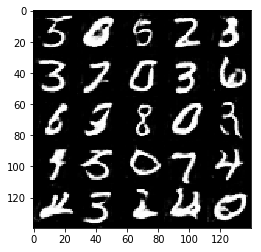

Epoch 2/2... Discriminator Loss: 1.4836... Generator Loss: 0.5034
Epoch 2/2... Discriminator Loss: 1.1503... Generator Loss: 1.7559
Epoch 2/2... Discriminator Loss: 1.2865... Generator Loss: 0.6114
Epoch 2/2... Discriminator Loss: 1.0812... Generator Loss: 0.9979
Epoch 2/2... Discriminator Loss: 1.0232... Generator Loss: 0.9447
Epoch 2/2... Discriminator Loss: 0.8945... Generator Loss: 1.0409
Epoch 2/2... Discriminator Loss: 0.8730... Generator Loss: 1.6184
Epoch 2/2... Discriminator Loss: 0.9568... Generator Loss: 0.9493
Epoch 2/2... Discriminator Loss: 1.6995... Generator Loss: 0.3893
Epoch 2/2... Discriminator Loss: 0.8708... Generator Loss: 1.1130


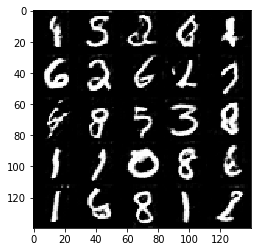

Epoch 2/2... Discriminator Loss: 1.0905... Generator Loss: 0.7611
Epoch 2/2... Discriminator Loss: 1.3451... Generator Loss: 0.5558
Epoch 2/2... Discriminator Loss: 1.3700... Generator Loss: 0.5676
Epoch 2/2... Discriminator Loss: 1.1000... Generator Loss: 2.0332
Epoch 2/2... Discriminator Loss: 1.3272... Generator Loss: 0.5679
Epoch 2/2... Discriminator Loss: 1.1604... Generator Loss: 1.0222
Epoch 2/2... Discriminator Loss: 1.1922... Generator Loss: 2.4478
Epoch 2/2... Discriminator Loss: 0.9500... Generator Loss: 1.1439
Epoch 2/2... Discriminator Loss: 1.2357... Generator Loss: 0.6440
Epoch 2/2... Discriminator Loss: 1.3328... Generator Loss: 0.6115


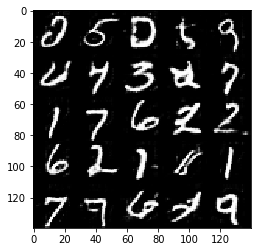

Epoch 2/2... Discriminator Loss: 1.5405... Generator Loss: 0.4428
Epoch 2/2... Discriminator Loss: 1.1489... Generator Loss: 0.7343
Epoch 2/2... Discriminator Loss: 1.0190... Generator Loss: 1.5178
Epoch 2/2... Discriminator Loss: 1.0681... Generator Loss: 1.7901
Epoch 2/2... Discriminator Loss: 0.8550... Generator Loss: 1.3236
Epoch 2/2... Discriminator Loss: 1.5240... Generator Loss: 0.4557
Epoch 2/2... Discriminator Loss: 1.7678... Generator Loss: 0.3996
Epoch 2/2... Discriminator Loss: 1.0205... Generator Loss: 0.9085
Epoch 2/2... Discriminator Loss: 0.9298... Generator Loss: 1.1935
Epoch 2/2... Discriminator Loss: 1.1238... Generator Loss: 0.7373


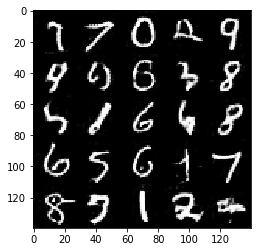

Epoch 2/2... Discriminator Loss: 1.3859... Generator Loss: 0.5985
Epoch 2/2... Discriminator Loss: 0.8737... Generator Loss: 1.3707
Epoch 2/2... Discriminator Loss: 1.0690... Generator Loss: 0.9115
Epoch 2/2... Discriminator Loss: 1.0304... Generator Loss: 1.0258
Epoch 2/2... Discriminator Loss: 1.0090... Generator Loss: 0.8983
Epoch 2/2... Discriminator Loss: 0.9872... Generator Loss: 1.0252
Epoch 2/2... Discriminator Loss: 0.8947... Generator Loss: 1.2588
Epoch 2/2... Discriminator Loss: 1.1962... Generator Loss: 0.7941
Epoch 2/2... Discriminator Loss: 0.8715... Generator Loss: 1.3773
Epoch 2/2... Discriminator Loss: 0.9491... Generator Loss: 1.2348


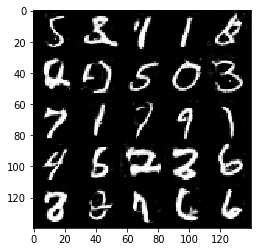

Epoch 2/2... Discriminator Loss: 1.7770... Generator Loss: 0.3571
Epoch 2/2... Discriminator Loss: 1.4933... Generator Loss: 0.5106
Epoch 2/2... Discriminator Loss: 0.7635... Generator Loss: 1.1803
Epoch 2/2... Discriminator Loss: 2.0225... Generator Loss: 0.2743
Epoch 2/2... Discriminator Loss: 0.9991... Generator Loss: 1.1426
Epoch 2/2... Discriminator Loss: 1.0076... Generator Loss: 1.4480
Epoch 2/2... Discriminator Loss: 1.3560... Generator Loss: 0.5636
Epoch 2/2... Discriminator Loss: 1.1329... Generator Loss: 0.8207
Epoch 2/2... Discriminator Loss: 1.0055... Generator Loss: 1.3885
Epoch 2/2... Discriminator Loss: 0.7409... Generator Loss: 1.4839


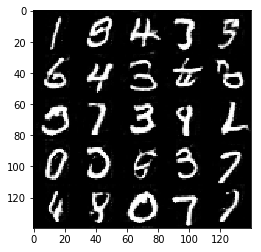

Epoch 2/2... Discriminator Loss: 0.8628... Generator Loss: 1.2886
Epoch 2/2... Discriminator Loss: 1.1684... Generator Loss: 0.7169
Epoch 2/2... Discriminator Loss: 0.9090... Generator Loss: 1.7447
Epoch 2/2... Discriminator Loss: 1.2652... Generator Loss: 0.6168
Epoch 2/2... Discriminator Loss: 0.7310... Generator Loss: 1.4996
Epoch 2/2... Discriminator Loss: 1.6377... Generator Loss: 0.3910
Epoch 2/2... Discriminator Loss: 1.3583... Generator Loss: 0.5216
Epoch 2/2... Discriminator Loss: 1.0202... Generator Loss: 0.7887
Epoch 2/2... Discriminator Loss: 1.2531... Generator Loss: 0.7235
Epoch 2/2... Discriminator Loss: 0.8770... Generator Loss: 1.0232


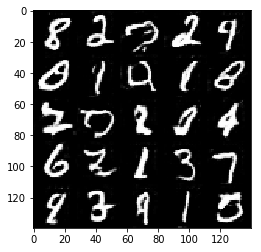

Epoch 2/2... Discriminator Loss: 1.0087... Generator Loss: 1.4935
Epoch 2/2... Discriminator Loss: 1.1693... Generator Loss: 1.0953
Epoch 2/2... Discriminator Loss: 1.4332... Generator Loss: 0.5188
Epoch 2/2... Discriminator Loss: 1.6116... Generator Loss: 2.8120
Epoch 2/2... Discriminator Loss: 0.8734... Generator Loss: 1.1256
Epoch 2/2... Discriminator Loss: 1.1190... Generator Loss: 1.8915
Epoch 2/2... Discriminator Loss: 1.3883... Generator Loss: 0.5204
Epoch 2/2... Discriminator Loss: 0.8211... Generator Loss: 1.1896
Epoch 2/2... Discriminator Loss: 1.2173... Generator Loss: 2.1839
Epoch 2/2... Discriminator Loss: 1.0087... Generator Loss: 1.0050


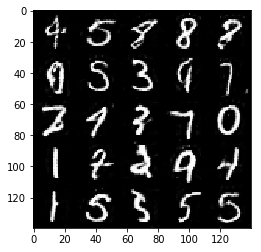

Epoch 2/2... Discriminator Loss: 1.3211... Generator Loss: 0.5674
Epoch 2/2... Discriminator Loss: 1.3429... Generator Loss: 0.5172
Epoch 2/2... Discriminator Loss: 1.0196... Generator Loss: 0.8315
Epoch 2/2... Discriminator Loss: 0.8554... Generator Loss: 1.1186
Epoch 2/2... Discriminator Loss: 0.8529... Generator Loss: 1.1338
Epoch 2/2... Discriminator Loss: 1.0527... Generator Loss: 0.8290
Epoch 2/2... Discriminator Loss: 1.1793... Generator Loss: 1.9600
Epoch 2/2... Discriminator Loss: 0.9196... Generator Loss: 1.5110
Epoch 2/2... Discriminator Loss: 0.8583... Generator Loss: 1.2993
Epoch 2/2... Discriminator Loss: 0.7739... Generator Loss: 1.9495


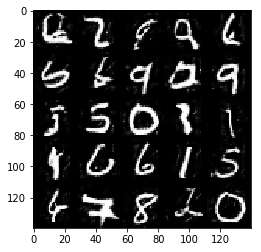

Epoch 2/2... Discriminator Loss: 1.7111... Generator Loss: 0.3697
Epoch 2/2... Discriminator Loss: 1.0184... Generator Loss: 0.9606
Epoch 2/2... Discriminator Loss: 1.0943... Generator Loss: 0.7935
Epoch 2/2... Discriminator Loss: 0.8323... Generator Loss: 1.2025
Epoch 2/2... Discriminator Loss: 0.7930... Generator Loss: 1.4345
Epoch 2/2... Discriminator Loss: 0.9171... Generator Loss: 0.9986
Epoch 2/2... Discriminator Loss: 1.0421... Generator Loss: 2.1315
Epoch 2/2... Discriminator Loss: 0.8611... Generator Loss: 1.1019
Epoch 2/2... Discriminator Loss: 0.9447... Generator Loss: 1.1164
Epoch 2/2... Discriminator Loss: 1.6670... Generator Loss: 0.4449


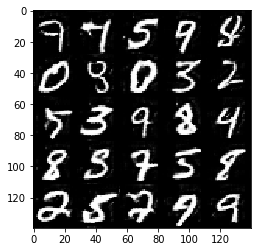

Epoch 2/2... Discriminator Loss: 0.7731... Generator Loss: 1.6307
Epoch 2/2... Discriminator Loss: 0.9119... Generator Loss: 1.9972
Epoch 2/2... Discriminator Loss: 0.9467... Generator Loss: 1.5607
Epoch 2/2... Discriminator Loss: 1.0050... Generator Loss: 0.9086
Epoch 2/2... Discriminator Loss: 1.2894... Generator Loss: 0.6316


In [73]:
batch_size = 32
z_dim = 100
learning_rate = 0.0008
beta1 = .3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 2.0436... Generator Loss: 8.5022
Epoch 1/1... Discriminator Loss: 1.3736... Generator Loss: 0.8300
Epoch 1/1... Discriminator Loss: 1.0231... Generator Loss: 1.5022
Epoch 1/1... Discriminator Loss: 2.6515... Generator Loss: 0.1571
Epoch 1/1... Discriminator Loss: 3.6364... Generator Loss: 0.0532
Epoch 1/1... Discriminator Loss: 2.8424... Generator Loss: 0.0964
Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 0.5599
Epoch 1/1... Discriminator Loss: 1.5489... Generator Loss: 1.2133
Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.7638
Epoch 1/1... Discriminator Loss: 1.7102... Generator Loss: 0.4119


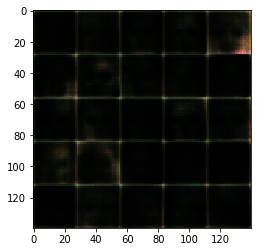

Epoch 1/1... Discriminator Loss: 1.9949... Generator Loss: 2.1819
Epoch 1/1... Discriminator Loss: 1.3533... Generator Loss: 0.9228
Epoch 1/1... Discriminator Loss: 1.7720... Generator Loss: 0.3842
Epoch 1/1... Discriminator Loss: 1.4888... Generator Loss: 1.3327
Epoch 1/1... Discriminator Loss: 1.2660... Generator Loss: 0.7510
Epoch 1/1... Discriminator Loss: 1.2174... Generator Loss: 0.6654
Epoch 1/1... Discriminator Loss: 1.0616... Generator Loss: 0.8380
Epoch 1/1... Discriminator Loss: 1.1568... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.8344... Generator Loss: 0.3336
Epoch 1/1... Discriminator Loss: 1.7092... Generator Loss: 0.4116


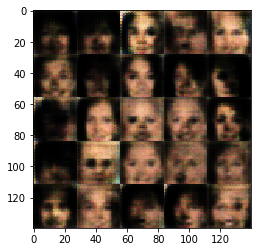

Epoch 1/1... Discriminator Loss: 1.7164... Generator Loss: 1.1328
Epoch 1/1... Discriminator Loss: 1.5159... Generator Loss: 0.5882
Epoch 1/1... Discriminator Loss: 1.2196... Generator Loss: 1.4612
Epoch 1/1... Discriminator Loss: 1.9562... Generator Loss: 0.2782
Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.7118
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 0.5560
Epoch 1/1... Discriminator Loss: 1.5006... Generator Loss: 0.5561
Epoch 1/1... Discriminator Loss: 1.1532... Generator Loss: 0.7659
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.6118
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.9475


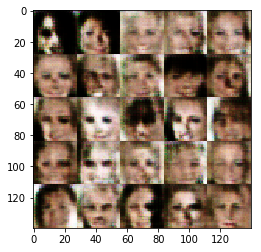

Epoch 1/1... Discriminator Loss: 0.9462... Generator Loss: 1.3493
Epoch 1/1... Discriminator Loss: 1.3750... Generator Loss: 0.6653
Epoch 1/1... Discriminator Loss: 1.3281... Generator Loss: 0.6759
Epoch 1/1... Discriminator Loss: 1.3771... Generator Loss: 0.8473
Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 0.8733
Epoch 1/1... Discriminator Loss: 1.1390... Generator Loss: 0.8025
Epoch 1/1... Discriminator Loss: 1.3416... Generator Loss: 0.6327
Epoch 1/1... Discriminator Loss: 1.7078... Generator Loss: 0.5790
Epoch 1/1... Discriminator Loss: 1.1782... Generator Loss: 1.0086
Epoch 1/1... Discriminator Loss: 1.4796... Generator Loss: 0.6541


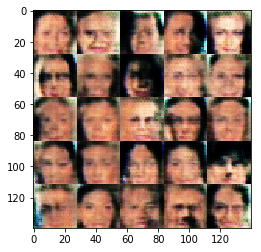

Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 0.9801
Epoch 1/1... Discriminator Loss: 1.5632... Generator Loss: 0.4973
Epoch 1/1... Discriminator Loss: 1.4989... Generator Loss: 0.8980
Epoch 1/1... Discriminator Loss: 1.3906... Generator Loss: 0.7165
Epoch 1/1... Discriminator Loss: 1.0843... Generator Loss: 1.0894
Epoch 1/1... Discriminator Loss: 1.2064... Generator Loss: 1.3584
Epoch 1/1... Discriminator Loss: 1.5848... Generator Loss: 1.6640
Epoch 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.5636
Epoch 1/1... Discriminator Loss: 1.4240... Generator Loss: 0.9376
Epoch 1/1... Discriminator Loss: 1.4356... Generator Loss: 0.5453


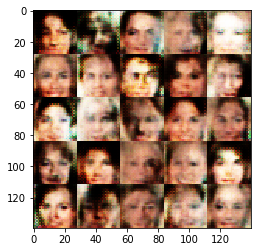

Epoch 1/1... Discriminator Loss: 1.5074... Generator Loss: 0.6120
Epoch 1/1... Discriminator Loss: 1.5156... Generator Loss: 0.6160
Epoch 1/1... Discriminator Loss: 1.3015... Generator Loss: 0.6600
Epoch 1/1... Discriminator Loss: 0.9845... Generator Loss: 1.3591
Epoch 1/1... Discriminator Loss: 1.5517... Generator Loss: 0.5854
Epoch 1/1... Discriminator Loss: 1.3744... Generator Loss: 0.8277
Epoch 1/1... Discriminator Loss: 1.3495... Generator Loss: 0.7377
Epoch 1/1... Discriminator Loss: 1.3014... Generator Loss: 0.6224
Epoch 1/1... Discriminator Loss: 1.2601... Generator Loss: 0.7697
Epoch 1/1... Discriminator Loss: 1.6201... Generator Loss: 0.6457


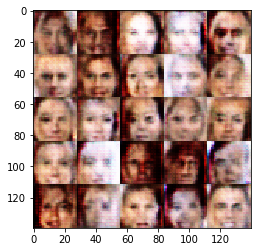

Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.7287
Epoch 1/1... Discriminator Loss: 1.4453... Generator Loss: 0.6257
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.7667
Epoch 1/1... Discriminator Loss: 1.4250... Generator Loss: 0.8225
Epoch 1/1... Discriminator Loss: 1.4132... Generator Loss: 0.8975
Epoch 1/1... Discriminator Loss: 1.4658... Generator Loss: 0.4803
Epoch 1/1... Discriminator Loss: 1.2061... Generator Loss: 0.7560
Epoch 1/1... Discriminator Loss: 1.2979... Generator Loss: 0.6774
Epoch 1/1... Discriminator Loss: 1.5883... Generator Loss: 1.2702
Epoch 1/1... Discriminator Loss: 1.2216... Generator Loss: 0.7825


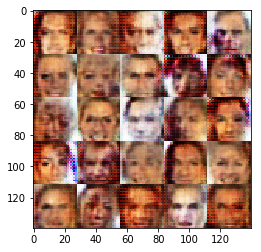

Epoch 1/1... Discriminator Loss: 1.1557... Generator Loss: 0.9518
Epoch 1/1... Discriminator Loss: 1.3245... Generator Loss: 0.6812
Epoch 1/1... Discriminator Loss: 1.2551... Generator Loss: 0.7225
Epoch 1/1... Discriminator Loss: 1.4576... Generator Loss: 0.4926
Epoch 1/1... Discriminator Loss: 1.3064... Generator Loss: 0.6042
Epoch 1/1... Discriminator Loss: 1.3315... Generator Loss: 0.7826
Epoch 1/1... Discriminator Loss: 1.1216... Generator Loss: 0.9492
Epoch 1/1... Discriminator Loss: 1.3362... Generator Loss: 0.4886
Epoch 1/1... Discriminator Loss: 1.4519... Generator Loss: 0.7040
Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.8508


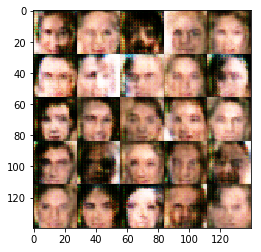

Epoch 1/1... Discriminator Loss: 1.4218... Generator Loss: 0.7185
Epoch 1/1... Discriminator Loss: 1.4712... Generator Loss: 0.5153
Epoch 1/1... Discriminator Loss: 1.4445... Generator Loss: 1.0333
Epoch 1/1... Discriminator Loss: 1.3416... Generator Loss: 0.9680
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.7755
Epoch 1/1... Discriminator Loss: 1.2873... Generator Loss: 0.6743
Epoch 1/1... Discriminator Loss: 1.4191... Generator Loss: 0.8188
Epoch 1/1... Discriminator Loss: 1.4107... Generator Loss: 0.8937
Epoch 1/1... Discriminator Loss: 1.4593... Generator Loss: 0.8293
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 0.8359


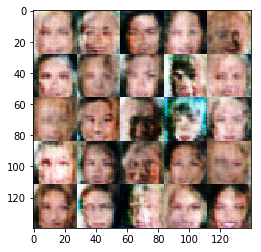

Epoch 1/1... Discriminator Loss: 1.5130... Generator Loss: 0.4842
Epoch 1/1... Discriminator Loss: 1.5936... Generator Loss: 0.4557
Epoch 1/1... Discriminator Loss: 1.2563... Generator Loss: 0.6690
Epoch 1/1... Discriminator Loss: 1.3717... Generator Loss: 1.1265
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.2829... Generator Loss: 1.1894
Epoch 1/1... Discriminator Loss: 1.5688... Generator Loss: 0.5426
Epoch 1/1... Discriminator Loss: 1.6447... Generator Loss: 0.6053
Epoch 1/1... Discriminator Loss: 1.2493... Generator Loss: 0.6015
Epoch 1/1... Discriminator Loss: 1.5547... Generator Loss: 1.1102


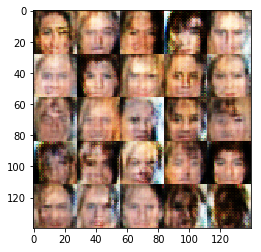

Epoch 1/1... Discriminator Loss: 1.5168... Generator Loss: 0.5536
Epoch 1/1... Discriminator Loss: 1.3473... Generator Loss: 0.8741
Epoch 1/1... Discriminator Loss: 1.2129... Generator Loss: 0.7604
Epoch 1/1... Discriminator Loss: 1.5071... Generator Loss: 0.6686
Epoch 1/1... Discriminator Loss: 1.3352... Generator Loss: 0.7026
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.8966
Epoch 1/1... Discriminator Loss: 1.4758... Generator Loss: 0.6302
Epoch 1/1... Discriminator Loss: 1.2784... Generator Loss: 0.6988
Epoch 1/1... Discriminator Loss: 1.4074... Generator Loss: 0.8339
Epoch 1/1... Discriminator Loss: 1.6009... Generator Loss: 0.3846


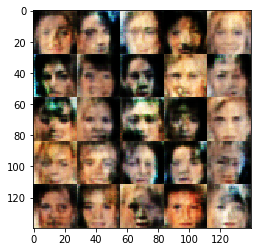

Epoch 1/1... Discriminator Loss: 1.1946... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.3271... Generator Loss: 0.7990
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.9012
Epoch 1/1... Discriminator Loss: 1.5766... Generator Loss: 0.7674
Epoch 1/1... Discriminator Loss: 1.4306... Generator Loss: 0.5276
Epoch 1/1... Discriminator Loss: 1.4936... Generator Loss: 1.0630
Epoch 1/1... Discriminator Loss: 1.3239... Generator Loss: 0.6886
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 1.2261
Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.9422
Epoch 1/1... Discriminator Loss: 1.3015... Generator Loss: 0.8608


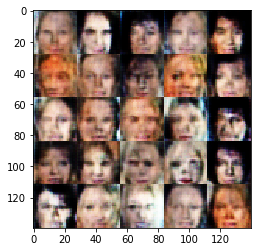

Epoch 1/1... Discriminator Loss: 1.3784... Generator Loss: 0.6355
Epoch 1/1... Discriminator Loss: 1.3380... Generator Loss: 0.9020
Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.6954
Epoch 1/1... Discriminator Loss: 1.4493... Generator Loss: 0.5993
Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 0.8278
Epoch 1/1... Discriminator Loss: 1.2922... Generator Loss: 0.8152
Epoch 1/1... Discriminator Loss: 1.5010... Generator Loss: 0.7931
Epoch 1/1... Discriminator Loss: 1.2243... Generator Loss: 0.7966
Epoch 1/1... Discriminator Loss: 1.5912... Generator Loss: 1.3557
Epoch 1/1... Discriminator Loss: 1.4753... Generator Loss: 0.7552


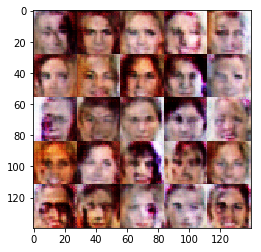

Epoch 1/1... Discriminator Loss: 1.4965... Generator Loss: 0.6737
Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.8019
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.7490
Epoch 1/1... Discriminator Loss: 1.6375... Generator Loss: 0.7707
Epoch 1/1... Discriminator Loss: 1.2072... Generator Loss: 0.6499
Epoch 1/1... Discriminator Loss: 1.5378... Generator Loss: 1.2617
Epoch 1/1... Discriminator Loss: 1.4506... Generator Loss: 1.0952
Epoch 1/1... Discriminator Loss: 1.3109... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.5414
Epoch 1/1... Discriminator Loss: 1.3641... Generator Loss: 0.7710


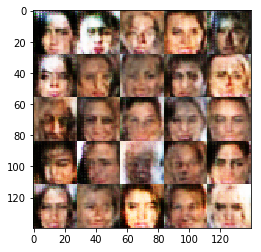

Epoch 1/1... Discriminator Loss: 1.4731... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.2369... Generator Loss: 0.7045
Epoch 1/1... Discriminator Loss: 1.2572... Generator Loss: 0.7254
Epoch 1/1... Discriminator Loss: 1.2535... Generator Loss: 1.0587
Epoch 1/1... Discriminator Loss: 1.3509... Generator Loss: 1.0473
Epoch 1/1... Discriminator Loss: 1.1356... Generator Loss: 0.9873
Epoch 1/1... Discriminator Loss: 1.3628... Generator Loss: 1.1700
Epoch 1/1... Discriminator Loss: 1.3115... Generator Loss: 0.6069
Epoch 1/1... Discriminator Loss: 1.5796... Generator Loss: 0.6243
Epoch 1/1... Discriminator Loss: 1.3714... Generator Loss: 0.7168


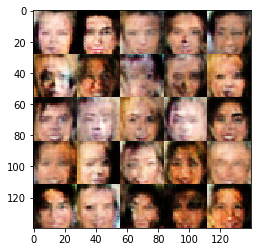

Epoch 1/1... Discriminator Loss: 1.3602... Generator Loss: 0.6517
Epoch 1/1... Discriminator Loss: 1.4626... Generator Loss: 0.7662
Epoch 1/1... Discriminator Loss: 1.4191... Generator Loss: 0.7683
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.7255
Epoch 1/1... Discriminator Loss: 1.4042... Generator Loss: 0.8796
Epoch 1/1... Discriminator Loss: 1.3836... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.6778
Epoch 1/1... Discriminator Loss: 1.1812... Generator Loss: 0.8459
Epoch 1/1... Discriminator Loss: 1.3643... Generator Loss: 0.6545
Epoch 1/1... Discriminator Loss: 1.4333... Generator Loss: 0.8005


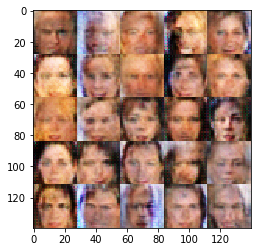

Epoch 1/1... Discriminator Loss: 1.3323... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.3247... Generator Loss: 1.2040
Epoch 1/1... Discriminator Loss: 1.2404... Generator Loss: 0.6743
Epoch 1/1... Discriminator Loss: 1.3603... Generator Loss: 0.8501
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.9853
Epoch 1/1... Discriminator Loss: 1.6585... Generator Loss: 0.3837
Epoch 1/1... Discriminator Loss: 1.4090... Generator Loss: 0.8573
Epoch 1/1... Discriminator Loss: 1.2771... Generator Loss: 0.5735
Epoch 1/1... Discriminator Loss: 1.5368... Generator Loss: 0.5375
Epoch 1/1... Discriminator Loss: 1.2751... Generator Loss: 0.9474


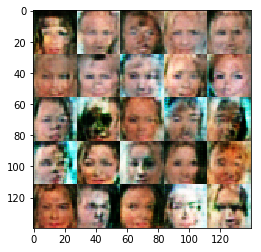

Epoch 1/1... Discriminator Loss: 1.5538... Generator Loss: 1.3375
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.7498
Epoch 1/1... Discriminator Loss: 1.3621... Generator Loss: 0.6456
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.5453
Epoch 1/1... Discriminator Loss: 1.2769... Generator Loss: 0.7813
Epoch 1/1... Discriminator Loss: 1.4140... Generator Loss: 0.8627
Epoch 1/1... Discriminator Loss: 1.5335... Generator Loss: 0.5599
Epoch 1/1... Discriminator Loss: 1.4677... Generator Loss: 0.5096
Epoch 1/1... Discriminator Loss: 1.3273... Generator Loss: 0.8176
Epoch 1/1... Discriminator Loss: 1.2900... Generator Loss: 0.6066


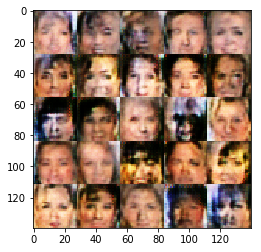

Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.3241... Generator Loss: 0.9658
Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.2385... Generator Loss: 0.8477
Epoch 1/1... Discriminator Loss: 1.6788... Generator Loss: 1.2222
Epoch 1/1... Discriminator Loss: 1.5033... Generator Loss: 0.6054
Epoch 1/1... Discriminator Loss: 1.4405... Generator Loss: 0.6387
Epoch 1/1... Discriminator Loss: 1.2565... Generator Loss: 1.0284
Epoch 1/1... Discriminator Loss: 1.4776... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.7080


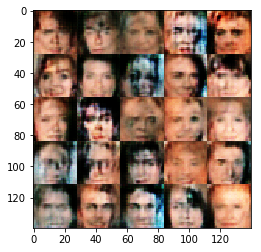

Epoch 1/1... Discriminator Loss: 1.4159... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.4695... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 1.5891... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 1.3542... Generator Loss: 0.9201
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.7136
Epoch 1/1... Discriminator Loss: 1.5111... Generator Loss: 0.7828
Epoch 1/1... Discriminator Loss: 1.3416... Generator Loss: 0.8846
Epoch 1/1... Discriminator Loss: 1.3229... Generator Loss: 0.6172
Epoch 1/1... Discriminator Loss: 1.1627... Generator Loss: 0.7543
Epoch 1/1... Discriminator Loss: 1.6242... Generator Loss: 0.5660


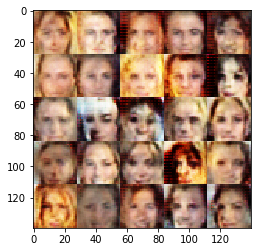

Epoch 1/1... Discriminator Loss: 1.2726... Generator Loss: 0.5939
Epoch 1/1... Discriminator Loss: 1.4159... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.2867... Generator Loss: 1.0279
Epoch 1/1... Discriminator Loss: 1.5230... Generator Loss: 0.5351
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 0.7908
Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.6802
Epoch 1/1... Discriminator Loss: 1.2431... Generator Loss: 0.6735
Epoch 1/1... Discriminator Loss: 1.4286... Generator Loss: 0.7812
Epoch 1/1... Discriminator Loss: 1.4345... Generator Loss: 0.8908
Epoch 1/1... Discriminator Loss: 1.1838... Generator Loss: 0.7521


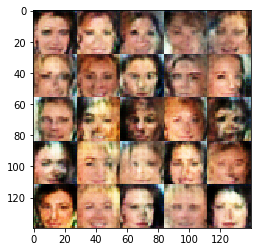

Epoch 1/1... Discriminator Loss: 1.2104... Generator Loss: 0.7250
Epoch 1/1... Discriminator Loss: 1.3716... Generator Loss: 1.0433
Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.9255
Epoch 1/1... Discriminator Loss: 1.3086... Generator Loss: 0.9662
Epoch 1/1... Discriminator Loss: 1.3467... Generator Loss: 0.8395
Epoch 1/1... Discriminator Loss: 1.2488... Generator Loss: 0.7757
Epoch 1/1... Discriminator Loss: 1.3813... Generator Loss: 0.6704
Epoch 1/1... Discriminator Loss: 1.1875... Generator Loss: 0.6931
Epoch 1/1... Discriminator Loss: 1.3119... Generator Loss: 0.7006
Epoch 1/1... Discriminator Loss: 1.3031... Generator Loss: 0.9715


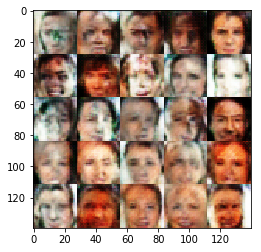

Epoch 1/1... Discriminator Loss: 1.4451... Generator Loss: 0.5416
Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.9273
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.7257
Epoch 1/1... Discriminator Loss: 1.3456... Generator Loss: 0.8575
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.5404
Epoch 1/1... Discriminator Loss: 1.3329... Generator Loss: 0.6686
Epoch 1/1... Discriminator Loss: 1.3002... Generator Loss: 0.6543
Epoch 1/1... Discriminator Loss: 1.3574... Generator Loss: 0.5925
Epoch 1/1... Discriminator Loss: 1.3695... Generator Loss: 0.5246
Epoch 1/1... Discriminator Loss: 1.6680... Generator Loss: 0.4154


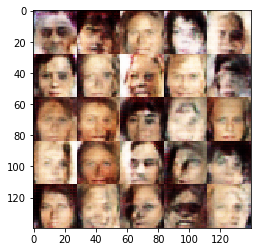

Epoch 1/1... Discriminator Loss: 1.7273... Generator Loss: 0.3292
Epoch 1/1... Discriminator Loss: 1.2563... Generator Loss: 1.0235
Epoch 1/1... Discriminator Loss: 1.5194... Generator Loss: 0.5910
Epoch 1/1... Discriminator Loss: 1.3483... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.8891
Epoch 1/1... Discriminator Loss: 1.3308... Generator Loss: 0.9117
Epoch 1/1... Discriminator Loss: 1.2709... Generator Loss: 0.6190
Epoch 1/1... Discriminator Loss: 1.5521... Generator Loss: 0.6144
Epoch 1/1... Discriminator Loss: 1.3318... Generator Loss: 0.8309
Epoch 1/1... Discriminator Loss: 1.3384... Generator Loss: 0.8468


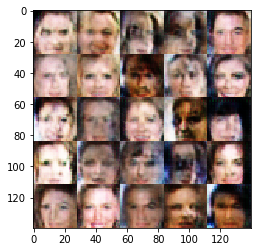

Epoch 1/1... Discriminator Loss: 1.3327... Generator Loss: 0.7252
Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.6232
Epoch 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.7077
Epoch 1/1... Discriminator Loss: 1.4277... Generator Loss: 0.8820
Epoch 1/1... Discriminator Loss: 1.2893... Generator Loss: 0.7757
Epoch 1/1... Discriminator Loss: 1.4146... Generator Loss: 0.6653
Epoch 1/1... Discriminator Loss: 1.1804... Generator Loss: 0.6352
Epoch 1/1... Discriminator Loss: 1.4046... Generator Loss: 0.6239
Epoch 1/1... Discriminator Loss: 1.5183... Generator Loss: 1.0850
Epoch 1/1... Discriminator Loss: 1.2553... Generator Loss: 0.8064


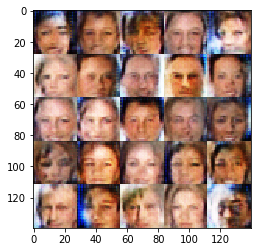

Epoch 1/1... Discriminator Loss: 1.3080... Generator Loss: 0.6774
Epoch 1/1... Discriminator Loss: 1.3334... Generator Loss: 0.9376
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 0.8587
Epoch 1/1... Discriminator Loss: 1.1843... Generator Loss: 0.7096
Epoch 1/1... Discriminator Loss: 1.4599... Generator Loss: 0.6932
Epoch 1/1... Discriminator Loss: 1.3681... Generator Loss: 0.7506
Epoch 1/1... Discriminator Loss: 1.2835... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.4586... Generator Loss: 0.5191
Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 1.0779
Epoch 1/1... Discriminator Loss: 1.4002... Generator Loss: 1.1155


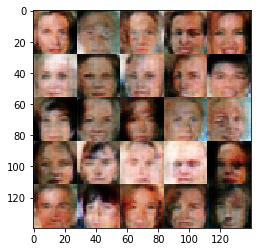

Epoch 1/1... Discriminator Loss: 1.4491... Generator Loss: 0.6652
Epoch 1/1... Discriminator Loss: 1.3720... Generator Loss: 0.7005
Epoch 1/1... Discriminator Loss: 1.3081... Generator Loss: 0.8762
Epoch 1/1... Discriminator Loss: 1.2919... Generator Loss: 0.6670
Epoch 1/1... Discriminator Loss: 1.2576... Generator Loss: 0.8717
Epoch 1/1... Discriminator Loss: 1.5244... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 1.3854... Generator Loss: 0.5707
Epoch 1/1... Discriminator Loss: 1.3628... Generator Loss: 0.7452
Epoch 1/1... Discriminator Loss: 1.3572... Generator Loss: 0.8098
Epoch 1/1... Discriminator Loss: 1.4525... Generator Loss: 0.6742


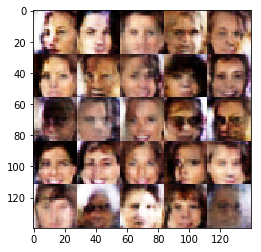

Epoch 1/1... Discriminator Loss: 1.1587... Generator Loss: 0.7666
Epoch 1/1... Discriminator Loss: 1.5491... Generator Loss: 1.0761
Epoch 1/1... Discriminator Loss: 1.4867... Generator Loss: 0.5092
Epoch 1/1... Discriminator Loss: 1.3816... Generator Loss: 0.6284
Epoch 1/1... Discriminator Loss: 1.3480... Generator Loss: 0.6735
Epoch 1/1... Discriminator Loss: 1.3621... Generator Loss: 1.0594
Epoch 1/1... Discriminator Loss: 1.5527... Generator Loss: 1.3659
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.8088
Epoch 1/1... Discriminator Loss: 1.5468... Generator Loss: 0.4843
Epoch 1/1... Discriminator Loss: 1.4524... Generator Loss: 0.5978


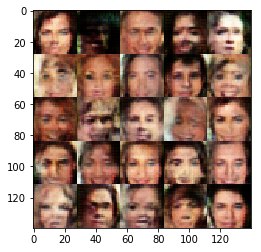

Epoch 1/1... Discriminator Loss: 1.2895... Generator Loss: 1.1416
Epoch 1/1... Discriminator Loss: 1.3593... Generator Loss: 0.8036
Epoch 1/1... Discriminator Loss: 1.3157... Generator Loss: 0.8035
Epoch 1/1... Discriminator Loss: 1.3269... Generator Loss: 0.7926
Epoch 1/1... Discriminator Loss: 1.3415... Generator Loss: 0.8571
Epoch 1/1... Discriminator Loss: 1.3406... Generator Loss: 0.6963
Epoch 1/1... Discriminator Loss: 1.1249... Generator Loss: 0.7316
Epoch 1/1... Discriminator Loss: 1.2804... Generator Loss: 0.9562
Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.9224
Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 0.8519


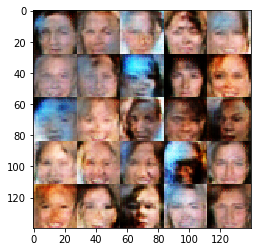

Epoch 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.7680
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.7996
Epoch 1/1... Discriminator Loss: 1.3504... Generator Loss: 0.8378
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.5716
Epoch 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.7620
Epoch 1/1... Discriminator Loss: 1.1821... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.2688... Generator Loss: 0.8298
Epoch 1/1... Discriminator Loss: 1.3568... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 0.6423
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.7254


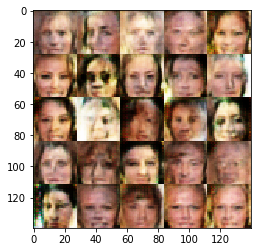

Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.6151
Epoch 1/1... Discriminator Loss: 1.2700... Generator Loss: 0.7975
Epoch 1/1... Discriminator Loss: 1.2898... Generator Loss: 0.8922
Epoch 1/1... Discriminator Loss: 1.3372... Generator Loss: 0.7232
Epoch 1/1... Discriminator Loss: 1.3240... Generator Loss: 0.8333
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.7777
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 1.0408
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.5793
Epoch 1/1... Discriminator Loss: 1.2931... Generator Loss: 0.7354


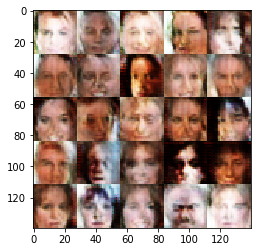

Epoch 1/1... Discriminator Loss: 1.4555... Generator Loss: 0.9575
Epoch 1/1... Discriminator Loss: 1.1722... Generator Loss: 1.0528
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.5152
Epoch 1/1... Discriminator Loss: 1.1987... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.4643... Generator Loss: 0.7638
Epoch 1/1... Discriminator Loss: 1.0887... Generator Loss: 0.7555
Epoch 1/1... Discriminator Loss: 1.1268... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.3755... Generator Loss: 0.8099
Epoch 1/1... Discriminator Loss: 1.3446... Generator Loss: 0.9186
Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.8097


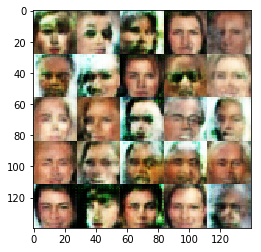

Epoch 1/1... Discriminator Loss: 1.3019... Generator Loss: 0.8654
Epoch 1/1... Discriminator Loss: 1.3975... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.3073... Generator Loss: 0.8225
Epoch 1/1... Discriminator Loss: 1.2811... Generator Loss: 1.0023
Epoch 1/1... Discriminator Loss: 1.4171... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 1.2790... Generator Loss: 0.7551
Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 0.7615
Epoch 1/1... Discriminator Loss: 1.4660... Generator Loss: 0.8874
Epoch 1/1... Discriminator Loss: 1.2698... Generator Loss: 0.8648
Epoch 1/1... Discriminator Loss: 1.2184... Generator Loss: 0.7680


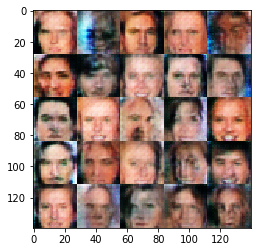

Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 0.8670
Epoch 1/1... Discriminator Loss: 1.3163... Generator Loss: 0.8240
Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.2945... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 1.3722... Generator Loss: 0.6724
Epoch 1/1... Discriminator Loss: 1.3132... Generator Loss: 0.8663
Epoch 1/1... Discriminator Loss: 1.1233... Generator Loss: 0.7766
Epoch 1/1... Discriminator Loss: 1.7656... Generator Loss: 0.2946
Epoch 1/1... Discriminator Loss: 1.1758... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 1.4416... Generator Loss: 0.6829


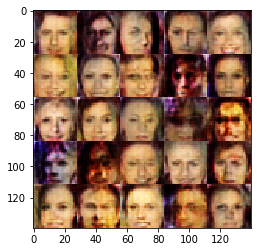

Epoch 1/1... Discriminator Loss: 1.4624... Generator Loss: 0.7867
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.7817
Epoch 1/1... Discriminator Loss: 1.2997... Generator Loss: 0.8069
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.9471
Epoch 1/1... Discriminator Loss: 1.3652... Generator Loss: 0.6470
Epoch 1/1... Discriminator Loss: 1.3823... Generator Loss: 0.7269
Epoch 1/1... Discriminator Loss: 1.3605... Generator Loss: 0.8967
Epoch 1/1... Discriminator Loss: 1.3132... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.8177
Epoch 1/1... Discriminator Loss: 1.4504... Generator Loss: 0.6965


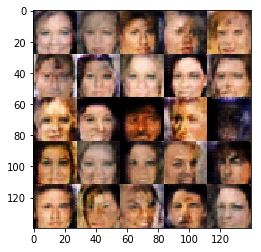

Epoch 1/1... Discriminator Loss: 1.2749... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 1.3815... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 1.1286... Generator Loss: 0.6778
Epoch 1/1... Discriminator Loss: 1.2813... Generator Loss: 0.9267
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 1.0506
Epoch 1/1... Discriminator Loss: 1.3693... Generator Loss: 0.6719
Epoch 1/1... Discriminator Loss: 1.3881... Generator Loss: 0.7811
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.7853
Epoch 1/1... Discriminator Loss: 1.8339... Generator Loss: 0.3617
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.7966


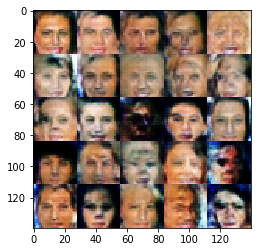

Epoch 1/1... Discriminator Loss: 1.4920... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 1.4495... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.8074
Epoch 1/1... Discriminator Loss: 1.3164... Generator Loss: 0.9610
Epoch 1/1... Discriminator Loss: 1.3340... Generator Loss: 0.7284
Epoch 1/1... Discriminator Loss: 1.2900... Generator Loss: 0.6294
Epoch 1/1... Discriminator Loss: 1.4319... Generator Loss: 0.9385
Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.6768
Epoch 1/1... Discriminator Loss: 1.3500... Generator Loss: 0.7663
Epoch 1/1... Discriminator Loss: 1.2562... Generator Loss: 0.7204


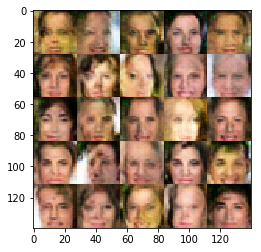

Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.9004
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.7729
Epoch 1/1... Discriminator Loss: 1.1804... Generator Loss: 0.6810
Epoch 1/1... Discriminator Loss: 1.3736... Generator Loss: 0.7403
Epoch 1/1... Discriminator Loss: 1.2773... Generator Loss: 1.1467
Epoch 1/1... Discriminator Loss: 1.3703... Generator Loss: 0.5740
Epoch 1/1... Discriminator Loss: 1.2654... Generator Loss: 0.7230
Epoch 1/1... Discriminator Loss: 1.1895... Generator Loss: 0.7490
Epoch 1/1... Discriminator Loss: 1.3321... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 1.5757... Generator Loss: 0.6286


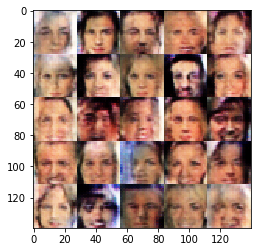

Epoch 1/1... Discriminator Loss: 1.2915... Generator Loss: 0.7591
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.6170
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.3783... Generator Loss: 0.6829
Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 0.8554
Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.8160
Epoch 1/1... Discriminator Loss: 1.2962... Generator Loss: 0.8758
Epoch 1/1... Discriminator Loss: 1.2439... Generator Loss: 0.8156
Epoch 1/1... Discriminator Loss: 1.2855... Generator Loss: 0.9298
Epoch 1/1... Discriminator Loss: 1.3446... Generator Loss: 0.6201


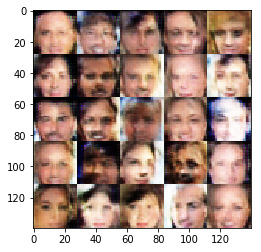

Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.6577
Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.5801
Epoch 1/1... Discriminator Loss: 1.5427... Generator Loss: 0.6474
Epoch 1/1... Discriminator Loss: 1.1221... Generator Loss: 0.8649
Epoch 1/1... Discriminator Loss: 1.2929... Generator Loss: 1.0888
Epoch 1/1... Discriminator Loss: 1.2002... Generator Loss: 0.8601
Epoch 1/1... Discriminator Loss: 1.2927... Generator Loss: 0.7095
Epoch 1/1... Discriminator Loss: 1.4025... Generator Loss: 0.5670
Epoch 1/1... Discriminator Loss: 1.2194... Generator Loss: 1.0247
Epoch 1/1... Discriminator Loss: 1.4258... Generator Loss: 0.4827


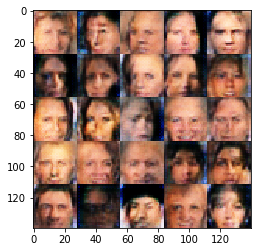

Epoch 1/1... Discriminator Loss: 1.1607... Generator Loss: 0.7550
Epoch 1/1... Discriminator Loss: 1.3103... Generator Loss: 0.7310
Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.7482
Epoch 1/1... Discriminator Loss: 1.3592... Generator Loss: 0.8404
Epoch 1/1... Discriminator Loss: 1.2905... Generator Loss: 0.8809
Epoch 1/1... Discriminator Loss: 1.3039... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 1.3589... Generator Loss: 0.7920
Epoch 1/1... Discriminator Loss: 1.3625... Generator Loss: 1.4136
Epoch 1/1... Discriminator Loss: 1.4000... Generator Loss: 0.7191
Epoch 1/1... Discriminator Loss: 1.4145... Generator Loss: 0.6338


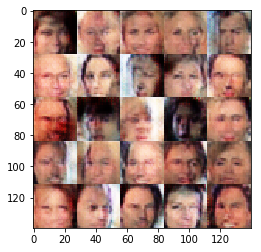

Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 1.0890
Epoch 1/1... Discriminator Loss: 1.5121... Generator Loss: 0.7223
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.9359
Epoch 1/1... Discriminator Loss: 1.2039... Generator Loss: 0.6731
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.7510
Epoch 1/1... Discriminator Loss: 1.2638... Generator Loss: 0.7707
Epoch 1/1... Discriminator Loss: 1.2044... Generator Loss: 0.7014
Epoch 1/1... Discriminator Loss: 1.3021... Generator Loss: 0.7218
Epoch 1/1... Discriminator Loss: 1.4502... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 1.2727... Generator Loss: 0.5930


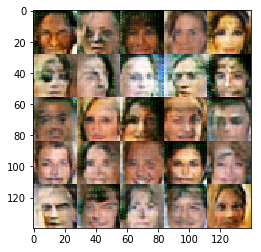

Epoch 1/1... Discriminator Loss: 1.1714... Generator Loss: 0.8160
Epoch 1/1... Discriminator Loss: 1.2824... Generator Loss: 0.8332
Epoch 1/1... Discriminator Loss: 1.3237... Generator Loss: 0.8491
Epoch 1/1... Discriminator Loss: 1.3133... Generator Loss: 0.8110
Epoch 1/1... Discriminator Loss: 1.3147... Generator Loss: 0.7544
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.9822
Epoch 1/1... Discriminator Loss: 1.2581... Generator Loss: 0.6674
Epoch 1/1... Discriminator Loss: 1.2891... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.3058... Generator Loss: 0.8820
Epoch 1/1... Discriminator Loss: 1.2385... Generator Loss: 0.8480


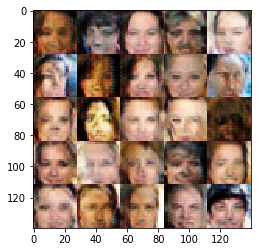

Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 0.7097
Epoch 1/1... Discriminator Loss: 1.5979... Generator Loss: 0.5963
Epoch 1/1... Discriminator Loss: 1.1251... Generator Loss: 1.1905
Epoch 1/1... Discriminator Loss: 1.3531... Generator Loss: 1.0324
Epoch 1/1... Discriminator Loss: 1.5611... Generator Loss: 0.4481
Epoch 1/1... Discriminator Loss: 1.2038... Generator Loss: 0.8349
Epoch 1/1... Discriminator Loss: 1.2217... Generator Loss: 0.5896
Epoch 1/1... Discriminator Loss: 1.6243... Generator Loss: 0.4859
Epoch 1/1... Discriminator Loss: 1.3646... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.2993... Generator Loss: 0.8706


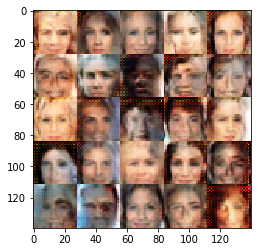

Epoch 1/1... Discriminator Loss: 1.3731... Generator Loss: 0.8286
Epoch 1/1... Discriminator Loss: 1.3183... Generator Loss: 0.7901
Epoch 1/1... Discriminator Loss: 1.3424... Generator Loss: 0.6156
Epoch 1/1... Discriminator Loss: 1.4611... Generator Loss: 0.5919
Epoch 1/1... Discriminator Loss: 1.2180... Generator Loss: 0.6076
Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.7419
Epoch 1/1... Discriminator Loss: 1.4684... Generator Loss: 0.5583
Epoch 1/1... Discriminator Loss: 1.3374... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 0.7857
Epoch 1/1... Discriminator Loss: 1.3143... Generator Loss: 0.8322


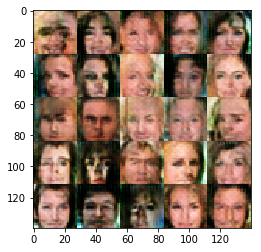

Epoch 1/1... Discriminator Loss: 1.3483... Generator Loss: 0.7618
Epoch 1/1... Discriminator Loss: 1.3825... Generator Loss: 0.8074
Epoch 1/1... Discriminator Loss: 1.2305... Generator Loss: 0.7546
Epoch 1/1... Discriminator Loss: 1.3713... Generator Loss: 0.5751
Epoch 1/1... Discriminator Loss: 1.3819... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 1.3880... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.1740... Generator Loss: 0.5866
Epoch 1/1... Discriminator Loss: 1.1555... Generator Loss: 0.7945
Epoch 1/1... Discriminator Loss: 1.3942... Generator Loss: 0.7844
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.8511


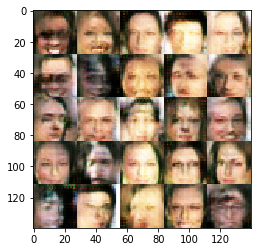

Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 0.7843
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.3851... Generator Loss: 0.9341
Epoch 1/1... Discriminator Loss: 1.1791... Generator Loss: 0.8170
Epoch 1/1... Discriminator Loss: 1.2634... Generator Loss: 1.0227
Epoch 1/1... Discriminator Loss: 1.3211... Generator Loss: 0.7713
Epoch 1/1... Discriminator Loss: 1.1985... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.1879... Generator Loss: 0.7983
Epoch 1/1... Discriminator Loss: 1.2112... Generator Loss: 0.8741
Epoch 1/1... Discriminator Loss: 1.3245... Generator Loss: 0.7758


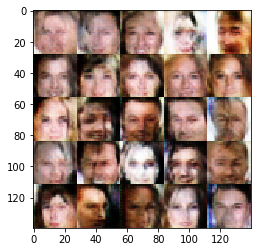

Epoch 1/1... Discriminator Loss: 1.2245... Generator Loss: 0.8796
Epoch 1/1... Discriminator Loss: 1.4434... Generator Loss: 0.7562
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.6664
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 1.0093
Epoch 1/1... Discriminator Loss: 1.2339... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 1.3205... Generator Loss: 0.9200
Epoch 1/1... Discriminator Loss: 1.8253... Generator Loss: 0.3983
Epoch 1/1... Discriminator Loss: 1.4589... Generator Loss: 0.6792
Epoch 1/1... Discriminator Loss: 1.2012... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.3181... Generator Loss: 0.6303


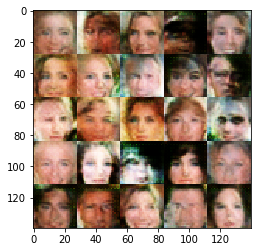

Epoch 1/1... Discriminator Loss: 1.5523... Generator Loss: 0.7593
Epoch 1/1... Discriminator Loss: 1.3514... Generator Loss: 0.7710
Epoch 1/1... Discriminator Loss: 1.2959... Generator Loss: 0.8160
Epoch 1/1... Discriminator Loss: 1.1232... Generator Loss: 0.7327
Epoch 1/1... Discriminator Loss: 1.3332... Generator Loss: 0.9078
Epoch 1/1... Discriminator Loss: 1.3396... Generator Loss: 0.8863
Epoch 1/1... Discriminator Loss: 1.0905... Generator Loss: 0.7259
Epoch 1/1... Discriminator Loss: 1.3414... Generator Loss: 0.9948
Epoch 1/1... Discriminator Loss: 1.3728... Generator Loss: 0.7226
Epoch 1/1... Discriminator Loss: 1.5160... Generator Loss: 0.5891


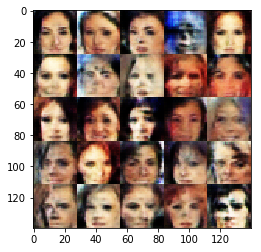

Epoch 1/1... Discriminator Loss: 1.3616... Generator Loss: 0.5622
Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 1.1580
Epoch 1/1... Discriminator Loss: 1.4862... Generator Loss: 0.7344
Epoch 1/1... Discriminator Loss: 1.2872... Generator Loss: 0.6647
Epoch 1/1... Discriminator Loss: 1.2451... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 0.5940
Epoch 1/1... Discriminator Loss: 1.2196... Generator Loss: 0.6747
Epoch 1/1... Discriminator Loss: 1.3385... Generator Loss: 0.8820
Epoch 1/1... Discriminator Loss: 1.2625... Generator Loss: 0.6842
Epoch 1/1... Discriminator Loss: 1.3320... Generator Loss: 0.6350


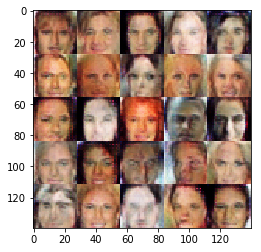

Epoch 1/1... Discriminator Loss: 1.2648... Generator Loss: 0.8395
Epoch 1/1... Discriminator Loss: 1.3331... Generator Loss: 0.8471
Epoch 1/1... Discriminator Loss: 1.1550... Generator Loss: 0.7474
Epoch 1/1... Discriminator Loss: 1.3450... Generator Loss: 0.8372
Epoch 1/1... Discriminator Loss: 1.3402... Generator Loss: 0.7452
Epoch 1/1... Discriminator Loss: 1.2300... Generator Loss: 0.6667
Epoch 1/1... Discriminator Loss: 1.3498... Generator Loss: 0.7340
Epoch 1/1... Discriminator Loss: 1.4687... Generator Loss: 1.1379
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.2113... Generator Loss: 0.8111


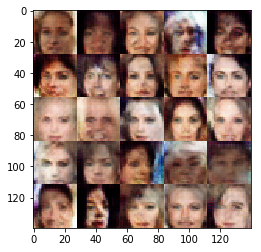

Epoch 1/1... Discriminator Loss: 1.2595... Generator Loss: 0.8514
Epoch 1/1... Discriminator Loss: 1.3672... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.3037... Generator Loss: 0.7519
Epoch 1/1... Discriminator Loss: 1.3206... Generator Loss: 0.8450
Epoch 1/1... Discriminator Loss: 1.3201... Generator Loss: 0.7054
Epoch 1/1... Discriminator Loss: 2.0388... Generator Loss: 0.2862
Epoch 1/1... Discriminator Loss: 1.4242... Generator Loss: 0.5387
Epoch 1/1... Discriminator Loss: 1.4661... Generator Loss: 0.6371
Epoch 1/1... Discriminator Loss: 1.2257... Generator Loss: 1.0092
Epoch 1/1... Discriminator Loss: 1.3114... Generator Loss: 0.8455


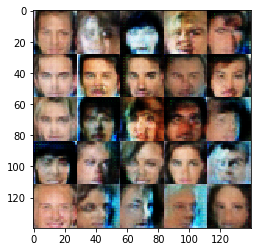

Epoch 1/1... Discriminator Loss: 1.2889... Generator Loss: 0.7474
Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.8866
Epoch 1/1... Discriminator Loss: 1.3758... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.6187
Epoch 1/1... Discriminator Loss: 1.4197... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 1.5233... Generator Loss: 0.6138
Epoch 1/1... Discriminator Loss: 1.2710... Generator Loss: 0.8595
Epoch 1/1... Discriminator Loss: 1.2448... Generator Loss: 0.9467
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.2722... Generator Loss: 0.7778


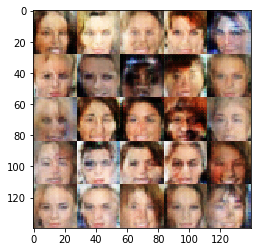

Epoch 1/1... Discriminator Loss: 1.3309... Generator Loss: 0.6822
Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.8848
Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.7453
Epoch 1/1... Discriminator Loss: 1.2665... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.5815
Epoch 1/1... Discriminator Loss: 1.1915... Generator Loss: 0.8278
Epoch 1/1... Discriminator Loss: 1.4661... Generator Loss: 0.7953
Epoch 1/1... Discriminator Loss: 1.4006... Generator Loss: 0.8694
Epoch 1/1... Discriminator Loss: 1.3202... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.2612... Generator Loss: 0.8029


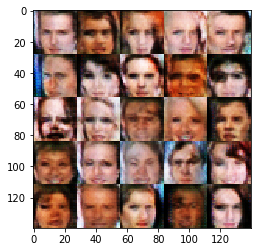

Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.7260
Epoch 1/1... Discriminator Loss: 1.3664... Generator Loss: 0.7240
Epoch 1/1... Discriminator Loss: 1.1241... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.6187
Epoch 1/1... Discriminator Loss: 1.2996... Generator Loss: 0.6750
Epoch 1/1... Discriminator Loss: 1.5489... Generator Loss: 0.4629
Epoch 1/1... Discriminator Loss: 1.3741... Generator Loss: 0.8923
Epoch 1/1... Discriminator Loss: 1.2209... Generator Loss: 0.6848
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.8886
Epoch 1/1... Discriminator Loss: 1.2964... Generator Loss: 0.7405


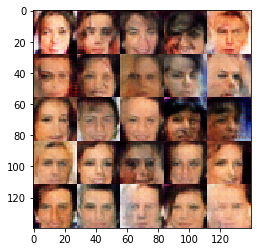

Epoch 1/1... Discriminator Loss: 1.4174... Generator Loss: 0.8026
Epoch 1/1... Discriminator Loss: 1.3405... Generator Loss: 0.7475
Epoch 1/1... Discriminator Loss: 1.1879... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.5952
Epoch 1/1... Discriminator Loss: 1.4590... Generator Loss: 0.7374
Epoch 1/1... Discriminator Loss: 1.3575... Generator Loss: 0.8640
Epoch 1/1... Discriminator Loss: 1.3285... Generator Loss: 0.7658
Epoch 1/1... Discriminator Loss: 1.4455... Generator Loss: 0.6842
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.7370
Epoch 1/1... Discriminator Loss: 1.3369... Generator Loss: 0.5566


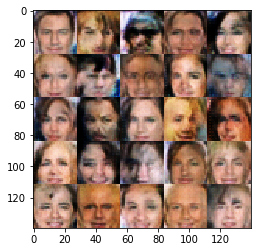

Epoch 1/1... Discriminator Loss: 1.2883... Generator Loss: 1.0646
Epoch 1/1... Discriminator Loss: 1.2574... Generator Loss: 0.7240
Epoch 1/1... Discriminator Loss: 1.5038... Generator Loss: 0.6714
Epoch 1/1... Discriminator Loss: 1.3869... Generator Loss: 0.8841
Epoch 1/1... Discriminator Loss: 1.3421... Generator Loss: 0.8257
Epoch 1/1... Discriminator Loss: 1.2643... Generator Loss: 0.8851
Epoch 1/1... Discriminator Loss: 1.2329... Generator Loss: 0.5839
Epoch 1/1... Discriminator Loss: 1.2492... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.2215... Generator Loss: 0.8335
Epoch 1/1... Discriminator Loss: 1.3138... Generator Loss: 0.7253


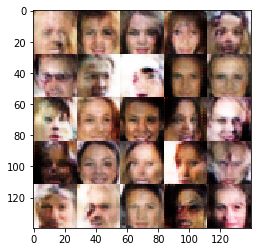

Epoch 1/1... Discriminator Loss: 1.3692... Generator Loss: 0.7489
Epoch 1/1... Discriminator Loss: 1.3994... Generator Loss: 0.7675
Epoch 1/1... Discriminator Loss: 1.1994... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.4203... Generator Loss: 0.6289
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.7131
Epoch 1/1... Discriminator Loss: 1.3431... Generator Loss: 0.7542
Epoch 1/1... Discriminator Loss: 1.1552... Generator Loss: 0.8045
Epoch 1/1... Discriminator Loss: 1.4987... Generator Loss: 0.6569
Epoch 1/1... Discriminator Loss: 1.2569... Generator Loss: 0.7805
Epoch 1/1... Discriminator Loss: 1.0336... Generator Loss: 0.7877


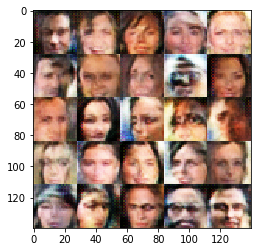

Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.7856
Epoch 1/1... Discriminator Loss: 1.4629... Generator Loss: 0.8931
Epoch 1/1... Discriminator Loss: 1.0128... Generator Loss: 0.7616
Epoch 1/1... Discriminator Loss: 1.2916... Generator Loss: 0.7479
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.7054
Epoch 1/1... Discriminator Loss: 1.2650... Generator Loss: 0.8194
Epoch 1/1... Discriminator Loss: 1.3882... Generator Loss: 0.6983
Epoch 1/1... Discriminator Loss: 1.3078... Generator Loss: 0.8782
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 0.7791
Epoch 1/1... Discriminator Loss: 1.3749... Generator Loss: 0.6352


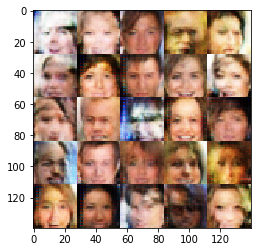

Epoch 1/1... Discriminator Loss: 1.3337... Generator Loss: 0.8146
Epoch 1/1... Discriminator Loss: 1.3806... Generator Loss: 0.9051
Epoch 1/1... Discriminator Loss: 1.2614... Generator Loss: 0.7877
Epoch 1/1... Discriminator Loss: 1.2209... Generator Loss: 0.6975
Epoch 1/1... Discriminator Loss: 1.2826... Generator Loss: 0.9432
Epoch 1/1... Discriminator Loss: 1.5262... Generator Loss: 0.7617
Epoch 1/1... Discriminator Loss: 1.7169... Generator Loss: 0.4081
Epoch 1/1... Discriminator Loss: 1.5307... Generator Loss: 0.6205
Epoch 1/1... Discriminator Loss: 1.4835... Generator Loss: 0.7388
Epoch 1/1... Discriminator Loss: 1.5242... Generator Loss: 0.6629


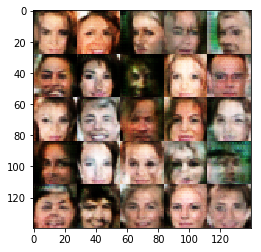

Epoch 1/1... Discriminator Loss: 1.3892... Generator Loss: 0.7041
Epoch 1/1... Discriminator Loss: 1.4219... Generator Loss: 0.7323
Epoch 1/1... Discriminator Loss: 1.3648... Generator Loss: 0.6287
Epoch 1/1... Discriminator Loss: 1.3865... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 1.4162... Generator Loss: 0.7165
Epoch 1/1... Discriminator Loss: 1.3031... Generator Loss: 0.8869
Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.3648... Generator Loss: 0.8139
Epoch 1/1... Discriminator Loss: 1.3297... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.3883... Generator Loss: 0.7347


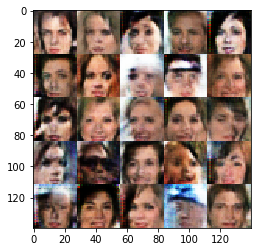

Epoch 1/1... Discriminator Loss: 1.4193... Generator Loss: 0.5506
Epoch 1/1... Discriminator Loss: 1.3376... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.5339... Generator Loss: 0.5593
Epoch 1/1... Discriminator Loss: 1.3369... Generator Loss: 0.8323
Epoch 1/1... Discriminator Loss: 1.3259... Generator Loss: 0.7593
Epoch 1/1... Discriminator Loss: 1.4429... Generator Loss: 0.5528
Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.3969... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.3524... Generator Loss: 0.8445
Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 0.8380


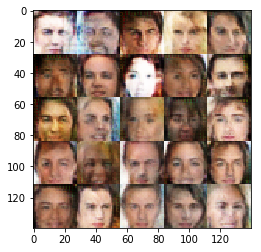

Epoch 1/1... Discriminator Loss: 1.3233... Generator Loss: 0.8096
Epoch 1/1... Discriminator Loss: 1.3730... Generator Loss: 0.8123
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 0.6155
Epoch 1/1... Discriminator Loss: 1.2681... Generator Loss: 0.7722
Epoch 1/1... Discriminator Loss: 1.2921... Generator Loss: 0.6334
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.6499
Epoch 1/1... Discriminator Loss: 1.2903... Generator Loss: 0.7828
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.7231
Epoch 1/1... Discriminator Loss: 1.5143... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.2982... Generator Loss: 0.7464


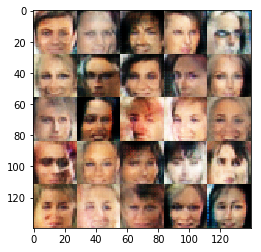

Epoch 1/1... Discriminator Loss: 1.4559... Generator Loss: 0.8714
Epoch 1/1... Discriminator Loss: 1.2867... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.3002... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.9211
Epoch 1/1... Discriminator Loss: 1.1563... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.2589... Generator Loss: 0.8041
Epoch 1/1... Discriminator Loss: 1.3632... Generator Loss: 0.7150
Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 0.8186
Epoch 1/1... Discriminator Loss: 1.6010... Generator Loss: 0.5040
Epoch 1/1... Discriminator Loss: 1.3512... Generator Loss: 0.9852


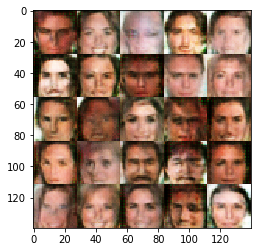

Epoch 1/1... Discriminator Loss: 1.3548... Generator Loss: 0.7177
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.5902
Epoch 1/1... Discriminator Loss: 1.2741... Generator Loss: 0.8369
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.6265
Epoch 1/1... Discriminator Loss: 1.4355... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.4032... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 1.2574... Generator Loss: 0.7841
Epoch 1/1... Discriminator Loss: 1.3490... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 1.5364... Generator Loss: 0.5133
Epoch 1/1... Discriminator Loss: 1.3237... Generator Loss: 0.8758


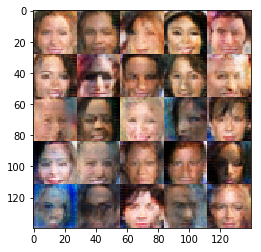

Epoch 1/1... Discriminator Loss: 1.3407... Generator Loss: 0.6484
Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.6966
Epoch 1/1... Discriminator Loss: 1.2529... Generator Loss: 0.7688
Epoch 1/1... Discriminator Loss: 1.6206... Generator Loss: 0.5516
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.2772... Generator Loss: 0.8262
Epoch 1/1... Discriminator Loss: 1.4020... Generator Loss: 0.8099
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.8040
Epoch 1/1... Discriminator Loss: 1.3827... Generator Loss: 0.7850
Epoch 1/1... Discriminator Loss: 1.3600... Generator Loss: 0.8085


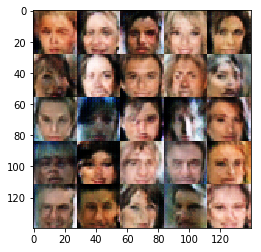

Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.6747
Epoch 1/1... Discriminator Loss: 1.2803... Generator Loss: 0.8381
Epoch 1/1... Discriminator Loss: 1.3299... Generator Loss: 0.9052
Epoch 1/1... Discriminator Loss: 1.3043... Generator Loss: 0.7277
Epoch 1/1... Discriminator Loss: 1.2131... Generator Loss: 0.6945
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 0.6743
Epoch 1/1... Discriminator Loss: 1.2497... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.1475... Generator Loss: 0.6801
Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 0.6872
Epoch 1/1... Discriminator Loss: 1.1985... Generator Loss: 0.7233


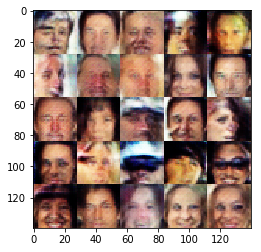

Epoch 1/1... Discriminator Loss: 1.3768... Generator Loss: 0.9173
Epoch 1/1... Discriminator Loss: 1.2808... Generator Loss: 1.0055
Epoch 1/1... Discriminator Loss: 1.3383... Generator Loss: 0.8240
Epoch 1/1... Discriminator Loss: 1.2131... Generator Loss: 0.9250
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.5946
Epoch 1/1... Discriminator Loss: 1.3420... Generator Loss: 0.7626
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.7443
Epoch 1/1... Discriminator Loss: 1.4230... Generator Loss: 0.7499
Epoch 1/1... Discriminator Loss: 1.2292... Generator Loss: 0.7593
Epoch 1/1... Discriminator Loss: 1.2403... Generator Loss: 0.7415


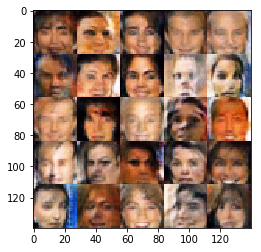

Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 0.6931
Epoch 1/1... Discriminator Loss: 1.3258... Generator Loss: 0.7909
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.7673
Epoch 1/1... Discriminator Loss: 1.1451... Generator Loss: 0.7733
Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 1.3503... Generator Loss: 0.7965
Epoch 1/1... Discriminator Loss: 1.1711... Generator Loss: 0.8304
Epoch 1/1... Discriminator Loss: 1.3261... Generator Loss: 0.8042
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 0.8299
Epoch 1/1... Discriminator Loss: 1.3446... Generator Loss: 0.6098


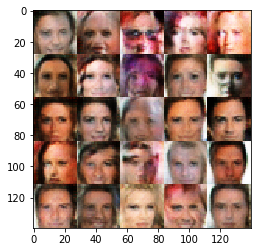

Epoch 1/1... Discriminator Loss: 1.5105... Generator Loss: 0.4712
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.8198
Epoch 1/1... Discriminator Loss: 1.3706... Generator Loss: 0.7062
Epoch 1/1... Discriminator Loss: 1.2987... Generator Loss: 0.8165
Epoch 1/1... Discriminator Loss: 1.3704... Generator Loss: 0.7329
Epoch 1/1... Discriminator Loss: 1.4780... Generator Loss: 0.7689
Epoch 1/1... Discriminator Loss: 1.2781... Generator Loss: 0.8320
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.6825
Epoch 1/1... Discriminator Loss: 1.3591... Generator Loss: 0.8469
Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.6389


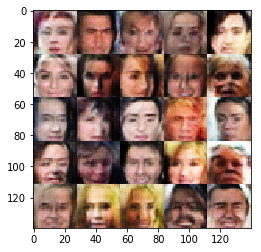

Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.7441
Epoch 1/1... Discriminator Loss: 1.4007... Generator Loss: 0.9083
Epoch 1/1... Discriminator Loss: 1.3563... Generator Loss: 0.6800
Epoch 1/1... Discriminator Loss: 1.4780... Generator Loss: 0.6596
Epoch 1/1... Discriminator Loss: 1.4073... Generator Loss: 0.6150
Epoch 1/1... Discriminator Loss: 1.3613... Generator Loss: 0.7646
Epoch 1/1... Discriminator Loss: 1.3078... Generator Loss: 0.7300
Epoch 1/1... Discriminator Loss: 1.2463... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.3359... Generator Loss: 0.7267
Epoch 1/1... Discriminator Loss: 1.2393... Generator Loss: 0.6392


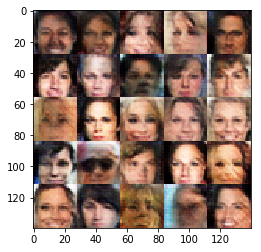

Epoch 1/1... Discriminator Loss: 1.2633... Generator Loss: 0.9396
Epoch 1/1... Discriminator Loss: 1.4490... Generator Loss: 0.5068
Epoch 1/1... Discriminator Loss: 1.2847... Generator Loss: 0.8543
Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.7776
Epoch 1/1... Discriminator Loss: 1.3615... Generator Loss: 0.6753
Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 0.7632
Epoch 1/1... Discriminator Loss: 1.3651... Generator Loss: 0.8100
Epoch 1/1... Discriminator Loss: 1.3085... Generator Loss: 0.9095
Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.9086
Epoch 1/1... Discriminator Loss: 1.3548... Generator Loss: 0.7676


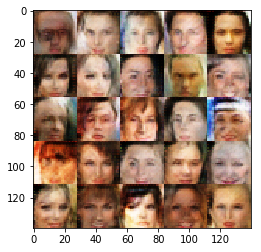

Epoch 1/1... Discriminator Loss: 1.3762... Generator Loss: 0.6692
Epoch 1/1... Discriminator Loss: 1.4860... Generator Loss: 0.7780
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.6243
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.8216
Epoch 1/1... Discriminator Loss: 1.4406... Generator Loss: 0.6893
Epoch 1/1... Discriminator Loss: 1.3370... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.8620
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.3459... Generator Loss: 0.9550


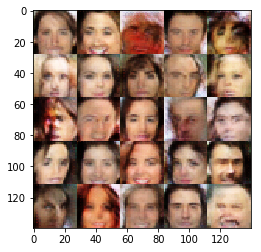

Epoch 1/1... Discriminator Loss: 1.3049... Generator Loss: 0.6710
Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.7773
Epoch 1/1... Discriminator Loss: 1.3082... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 1.2585... Generator Loss: 0.8185
Epoch 1/1... Discriminator Loss: 1.3523... Generator Loss: 0.7940
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.5332
Epoch 1/1... Discriminator Loss: 1.3458... Generator Loss: 0.8878
Epoch 1/1... Discriminator Loss: 1.3350... Generator Loss: 0.7749
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.7954
Epoch 1/1... Discriminator Loss: 1.4269... Generator Loss: 0.6459


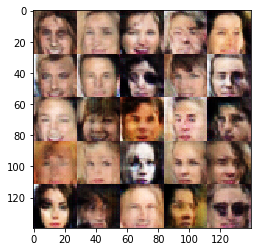

Epoch 1/1... Discriminator Loss: 1.3789... Generator Loss: 0.7784
Epoch 1/1... Discriminator Loss: 1.2898... Generator Loss: 0.8637
Epoch 1/1... Discriminator Loss: 1.1385... Generator Loss: 0.7663
Epoch 1/1... Discriminator Loss: 1.3478... Generator Loss: 0.7246
Epoch 1/1... Discriminator Loss: 1.3518... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.2499... Generator Loss: 0.9276
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.7403
Epoch 1/1... Discriminator Loss: 1.2912... Generator Loss: 0.7861
Epoch 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.7660
Epoch 1/1... Discriminator Loss: 1.3802... Generator Loss: 0.7849


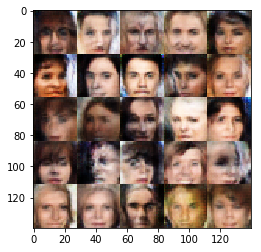

Epoch 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 1.3343... Generator Loss: 0.9899
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.9038
Epoch 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.7614
Epoch 1/1... Discriminator Loss: 1.4055... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.2441... Generator Loss: 0.8744
Epoch 1/1... Discriminator Loss: 1.3068... Generator Loss: 0.7347
Epoch 1/1... Discriminator Loss: 1.3288... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.7156
Epoch 1/1... Discriminator Loss: 1.3769... Generator Loss: 0.7610


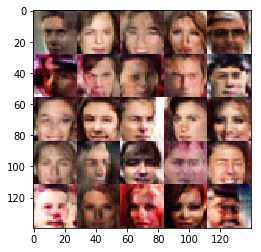

Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.7979
Epoch 1/1... Discriminator Loss: 1.1952... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.7200
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.7027
Epoch 1/1... Discriminator Loss: 1.3950... Generator Loss: 0.6637
Epoch 1/1... Discriminator Loss: 1.2960... Generator Loss: 0.7018
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.8397
Epoch 1/1... Discriminator Loss: 1.3731... Generator Loss: 0.7084
Epoch 1/1... Discriminator Loss: 1.3721... Generator Loss: 0.8445
Epoch 1/1... Discriminator Loss: 1.4812... Generator Loss: 0.6119


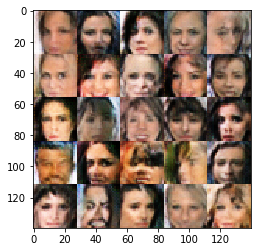

Epoch 1/1... Discriminator Loss: 1.1559... Generator Loss: 0.7355
Epoch 1/1... Discriminator Loss: 1.4010... Generator Loss: 0.7848
Epoch 1/1... Discriminator Loss: 1.3439... Generator Loss: 0.7914
Epoch 1/1... Discriminator Loss: 1.2200... Generator Loss: 0.6710
Epoch 1/1... Discriminator Loss: 1.3529... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.2829... Generator Loss: 0.7794
Epoch 1/1... Discriminator Loss: 1.1936... Generator Loss: 0.7116
Epoch 1/1... Discriminator Loss: 1.5712... Generator Loss: 0.5841
Epoch 1/1... Discriminator Loss: 1.1423... Generator Loss: 0.6973
Epoch 1/1... Discriminator Loss: 1.4004... Generator Loss: 0.7919


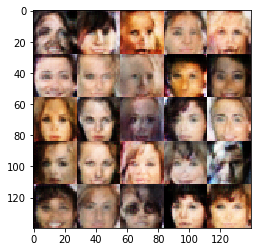

Epoch 1/1... Discriminator Loss: 1.2989... Generator Loss: 1.1233
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.8002
Epoch 1/1... Discriminator Loss: 1.3017... Generator Loss: 0.8092
Epoch 1/1... Discriminator Loss: 1.4838... Generator Loss: 0.7424
Epoch 1/1... Discriminator Loss: 1.3645... Generator Loss: 0.9351
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 0.9676... Generator Loss: 0.8601
Epoch 1/1... Discriminator Loss: 1.4195... Generator Loss: 0.8016
Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.3609... Generator Loss: 0.8001


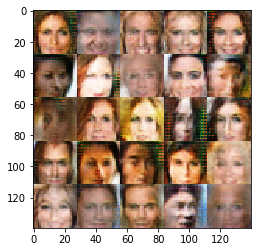

Epoch 1/1... Discriminator Loss: 1.2115... Generator Loss: 0.7136
Epoch 1/1... Discriminator Loss: 1.2181... Generator Loss: 0.9142
Epoch 1/1... Discriminator Loss: 1.4968... Generator Loss: 0.7694
Epoch 1/1... Discriminator Loss: 1.2993... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 1.2792... Generator Loss: 0.8978
Epoch 1/1... Discriminator Loss: 1.2787... Generator Loss: 0.8538
Epoch 1/1... Discriminator Loss: 1.3859... Generator Loss: 0.8106
Epoch 1/1... Discriminator Loss: 1.2208... Generator Loss: 0.7584
Epoch 1/1... Discriminator Loss: 1.4402... Generator Loss: 0.5702
Epoch 1/1... Discriminator Loss: 1.4675... Generator Loss: 0.5702


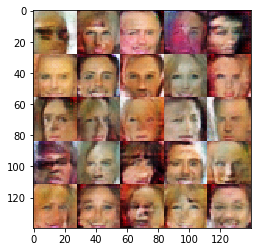

Epoch 1/1... Discriminator Loss: 1.4557... Generator Loss: 0.8845
Epoch 1/1... Discriminator Loss: 1.2256... Generator Loss: 0.8338
Epoch 1/1... Discriminator Loss: 1.1306... Generator Loss: 0.7023
Epoch 1/1... Discriminator Loss: 1.3513... Generator Loss: 0.8998
Epoch 1/1... Discriminator Loss: 1.2339... Generator Loss: 0.7496
Epoch 1/1... Discriminator Loss: 1.3502... Generator Loss: 0.7664
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 0.7165
Epoch 1/1... Discriminator Loss: 1.4127... Generator Loss: 0.8434
Epoch 1/1... Discriminator Loss: 1.2492... Generator Loss: 0.7771
Epoch 1/1... Discriminator Loss: 1.4624... Generator Loss: 0.6516


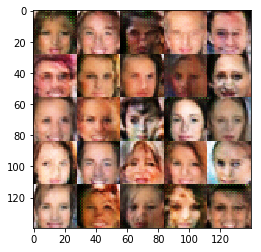

Epoch 1/1... Discriminator Loss: 1.2795... Generator Loss: 0.7485
Epoch 1/1... Discriminator Loss: 1.2965... Generator Loss: 0.7081
Epoch 1/1... Discriminator Loss: 1.4253... Generator Loss: 0.8246
Epoch 1/1... Discriminator Loss: 1.2818... Generator Loss: 0.7396
Epoch 1/1... Discriminator Loss: 1.4467... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.8494
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 1.3263... Generator Loss: 0.6971
Epoch 1/1... Discriminator Loss: 1.3747... Generator Loss: 0.7755
Epoch 1/1... Discriminator Loss: 1.3057... Generator Loss: 0.7551


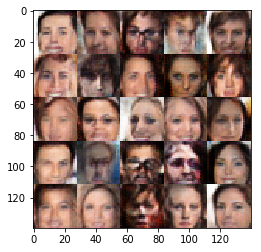

Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.7428
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.6121
Epoch 1/1... Discriminator Loss: 1.2770... Generator Loss: 0.8320
Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.7792
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.7041
Epoch 1/1... Discriminator Loss: 1.2866... Generator Loss: 0.7780
Epoch 1/1... Discriminator Loss: 1.4415... Generator Loss: 0.7220
Epoch 1/1... Discriminator Loss: 1.2475... Generator Loss: 0.7795
Epoch 1/1... Discriminator Loss: 1.4799... Generator Loss: 0.6902
Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.7100


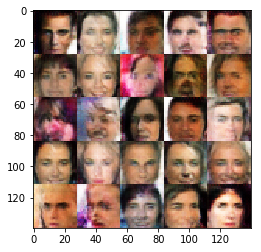

Epoch 1/1... Discriminator Loss: 1.2602... Generator Loss: 0.8218
Epoch 1/1... Discriminator Loss: 1.2870... Generator Loss: 0.6782
Epoch 1/1... Discriminator Loss: 1.3066... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.3219... Generator Loss: 0.8205
Epoch 1/1... Discriminator Loss: 1.3048... Generator Loss: 0.6937
Epoch 1/1... Discriminator Loss: 1.1568... Generator Loss: 0.8357
Epoch 1/1... Discriminator Loss: 1.3173... Generator Loss: 0.7943
Epoch 1/1... Discriminator Loss: 1.3039... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.4050... Generator Loss: 0.8849
Epoch 1/1... Discriminator Loss: 1.3333... Generator Loss: 0.7043


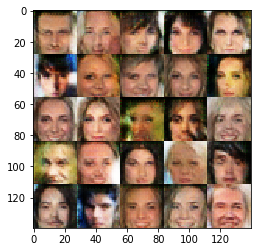

Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.7771
Epoch 1/1... Discriminator Loss: 1.2506... Generator Loss: 0.7870
Epoch 1/1... Discriminator Loss: 1.2884... Generator Loss: 0.7368
Epoch 1/1... Discriminator Loss: 1.2498... Generator Loss: 0.8957
Epoch 1/1... Discriminator Loss: 1.3229... Generator Loss: 0.7303
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 0.7870
Epoch 1/1... Discriminator Loss: 1.4578... Generator Loss: 0.6676
Epoch 1/1... Discriminator Loss: 1.3149... Generator Loss: 0.7526
Epoch 1/1... Discriminator Loss: 1.3750... Generator Loss: 0.8160
Epoch 1/1... Discriminator Loss: 1.4351... Generator Loss: 0.6971


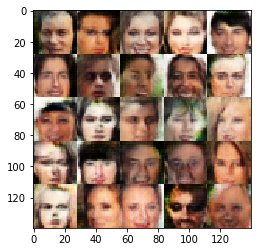

Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.7990
Epoch 1/1... Discriminator Loss: 1.1821... Generator Loss: 0.6733
Epoch 1/1... Discriminator Loss: 1.3956... Generator Loss: 0.6825
Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.9435
Epoch 1/1... Discriminator Loss: 1.3093... Generator Loss: 0.7630
Epoch 1/1... Discriminator Loss: 1.3058... Generator Loss: 0.7489
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.6657
Epoch 1/1... Discriminator Loss: 1.5524... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 1.2887... Generator Loss: 0.9154
Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.7820


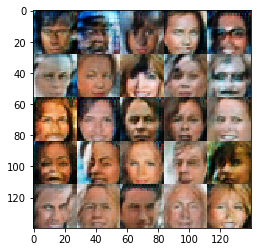

Epoch 1/1... Discriminator Loss: 1.3952... Generator Loss: 0.8916
Epoch 1/1... Discriminator Loss: 1.3569... Generator Loss: 0.8618
Epoch 1/1... Discriminator Loss: 1.2865... Generator Loss: 0.8993
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.6955
Epoch 1/1... Discriminator Loss: 1.3417... Generator Loss: 0.8610
Epoch 1/1... Discriminator Loss: 1.3983... Generator Loss: 0.5748
Epoch 1/1... Discriminator Loss: 1.3663... Generator Loss: 0.8140
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 0.7709
Epoch 1/1... Discriminator Loss: 1.2028... Generator Loss: 0.7864
Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.6663


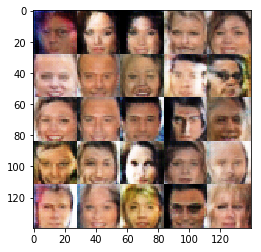

Epoch 1/1... Discriminator Loss: 1.2168... Generator Loss: 0.9078
Epoch 1/1... Discriminator Loss: 1.2652... Generator Loss: 0.6728
Epoch 1/1... Discriminator Loss: 1.3464... Generator Loss: 0.9234
Epoch 1/1... Discriminator Loss: 1.2924... Generator Loss: 0.6782
Epoch 1/1... Discriminator Loss: 1.3648... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.2321... Generator Loss: 0.9009
Epoch 1/1... Discriminator Loss: 1.2327... Generator Loss: 0.7877
Epoch 1/1... Discriminator Loss: 1.4050... Generator Loss: 0.6459
Epoch 1/1... Discriminator Loss: 1.3210... Generator Loss: 0.7109
Epoch 1/1... Discriminator Loss: 1.4398... Generator Loss: 0.7119


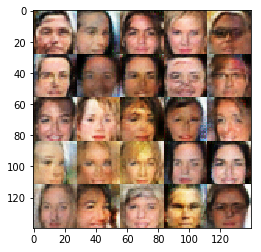

Epoch 1/1... Discriminator Loss: 1.3618... Generator Loss: 0.7136
Epoch 1/1... Discriminator Loss: 1.2689... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 1.2604... Generator Loss: 0.6613
Epoch 1/1... Discriminator Loss: 1.2868... Generator Loss: 0.7904
Epoch 1/1... Discriminator Loss: 1.1164... Generator Loss: 0.8149
Epoch 1/1... Discriminator Loss: 1.4174... Generator Loss: 0.6905
Epoch 1/1... Discriminator Loss: 1.3313... Generator Loss: 0.9526
Epoch 1/1... Discriminator Loss: 1.3177... Generator Loss: 0.7968
Epoch 1/1... Discriminator Loss: 1.3628... Generator Loss: 0.7535
Epoch 1/1... Discriminator Loss: 1.2757... Generator Loss: 0.7671


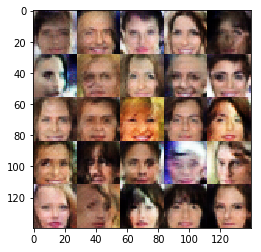

Epoch 1/1... Discriminator Loss: 1.2078... Generator Loss: 0.8857
Epoch 1/1... Discriminator Loss: 1.2993... Generator Loss: 0.6967
Epoch 1/1... Discriminator Loss: 1.3629... Generator Loss: 0.7539
Epoch 1/1... Discriminator Loss: 1.2952... Generator Loss: 0.8484
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 0.7654
Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.9171
Epoch 1/1... Discriminator Loss: 1.3019... Generator Loss: 0.8265
Epoch 1/1... Discriminator Loss: 1.2349... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.3894... Generator Loss: 0.8512
Epoch 1/1... Discriminator Loss: 1.2640... Generator Loss: 0.7125


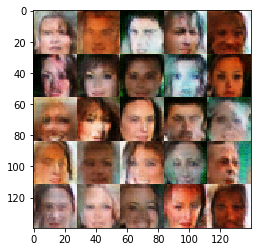

Epoch 1/1... Discriminator Loss: 1.4042... Generator Loss: 0.7754
Epoch 1/1... Discriminator Loss: 1.2921... Generator Loss: 0.8277
Epoch 1/1... Discriminator Loss: 1.3540... Generator Loss: 0.7673
Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 0.7164
Epoch 1/1... Discriminator Loss: 1.4185... Generator Loss: 0.8469
Epoch 1/1... Discriminator Loss: 1.2865... Generator Loss: 0.8231
Epoch 1/1... Discriminator Loss: 1.2864... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 1.3277... Generator Loss: 0.8812
Epoch 1/1... Discriminator Loss: 1.3454... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.3756... Generator Loss: 0.6550


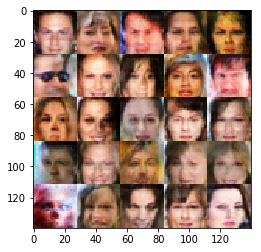

Epoch 1/1... Discriminator Loss: 1.3677... Generator Loss: 0.8061
Epoch 1/1... Discriminator Loss: 1.2080... Generator Loss: 0.6748
Epoch 1/1... Discriminator Loss: 1.3942... Generator Loss: 0.7538
Epoch 1/1... Discriminator Loss: 1.2933... Generator Loss: 0.5652
Epoch 1/1... Discriminator Loss: 1.2636... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.8979
Epoch 1/1... Discriminator Loss: 1.2306... Generator Loss: 0.7570
Epoch 1/1... Discriminator Loss: 1.3581... Generator Loss: 0.7659
Epoch 1/1... Discriminator Loss: 1.3974... Generator Loss: 0.6488
Epoch 1/1... Discriminator Loss: 1.1352... Generator Loss: 0.8532


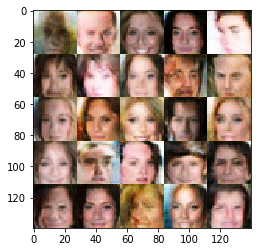

Epoch 1/1... Discriminator Loss: 1.2035... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 1.1528... Generator Loss: 0.9627
Epoch 1/1... Discriminator Loss: 1.2561... Generator Loss: 0.9271
Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 0.6618
Epoch 1/1... Discriminator Loss: 1.1843... Generator Loss: 0.7861
Epoch 1/1... Discriminator Loss: 1.3805... Generator Loss: 0.7912
Epoch 1/1... Discriminator Loss: 1.3585... Generator Loss: 0.7905
Epoch 1/1... Discriminator Loss: 1.3614... Generator Loss: 1.0053
Epoch 1/1... Discriminator Loss: 1.2378... Generator Loss: 0.6314
Epoch 1/1... Discriminator Loss: 1.4711... Generator Loss: 0.6286


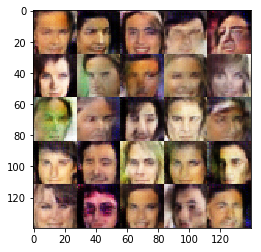

Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.7457
Epoch 1/1... Discriminator Loss: 1.3593... Generator Loss: 0.6590
Epoch 1/1... Discriminator Loss: 1.2263... Generator Loss: 0.7736
Epoch 1/1... Discriminator Loss: 1.1735... Generator Loss: 0.7379
Epoch 1/1... Discriminator Loss: 1.4466... Generator Loss: 0.7859
Epoch 1/1... Discriminator Loss: 1.2381... Generator Loss: 0.7557
Epoch 1/1... Discriminator Loss: 1.2089... Generator Loss: 0.7700
Epoch 1/1... Discriminator Loss: 1.2193... Generator Loss: 0.7567
Epoch 1/1... Discriminator Loss: 1.3369... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.3270... Generator Loss: 0.8060


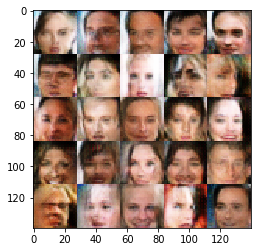

Epoch 1/1... Discriminator Loss: 1.3448... Generator Loss: 0.7252
Epoch 1/1... Discriminator Loss: 1.4456... Generator Loss: 0.6968
Epoch 1/1... Discriminator Loss: 1.2216... Generator Loss: 0.6784
Epoch 1/1... Discriminator Loss: 1.3402... Generator Loss: 0.7722
Epoch 1/1... Discriminator Loss: 1.4087... Generator Loss: 0.7177
Epoch 1/1... Discriminator Loss: 1.5127... Generator Loss: 0.6439
Epoch 1/1... Discriminator Loss: 1.2328... Generator Loss: 0.8868
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.7467
Epoch 1/1... Discriminator Loss: 1.4504... Generator Loss: 0.7330
Epoch 1/1... Discriminator Loss: 1.3549... Generator Loss: 0.8315


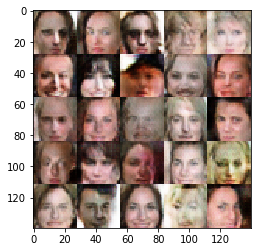

Epoch 1/1... Discriminator Loss: 1.3219... Generator Loss: 0.7693
Epoch 1/1... Discriminator Loss: 1.3102... Generator Loss: 0.7620
Epoch 1/1... Discriminator Loss: 1.3831... Generator Loss: 0.8168
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.7997
Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.6163
Epoch 1/1... Discriminator Loss: 1.3409... Generator Loss: 0.8353
Epoch 1/1... Discriminator Loss: 1.4137... Generator Loss: 0.6740
Epoch 1/1... Discriminator Loss: 1.4093... Generator Loss: 0.8268
Epoch 1/1... Discriminator Loss: 1.3506... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 1.3184... Generator Loss: 0.5909


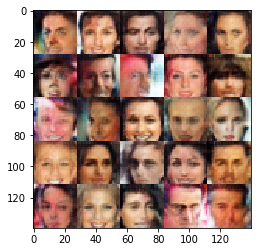

Epoch 1/1... Discriminator Loss: 1.1692... Generator Loss: 0.7728
Epoch 1/1... Discriminator Loss: 1.4597... Generator Loss: 0.7589
Epoch 1/1... Discriminator Loss: 1.3803... Generator Loss: 0.7155
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.3035... Generator Loss: 0.7805
Epoch 1/1... Discriminator Loss: 1.1823... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.7994
Epoch 1/1... Discriminator Loss: 1.4052... Generator Loss: 0.7866
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.7187
Epoch 1/1... Discriminator Loss: 1.2779... Generator Loss: 0.6538


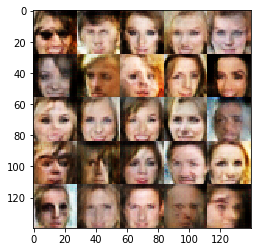

Epoch 1/1... Discriminator Loss: 1.2896... Generator Loss: 0.6867
Epoch 1/1... Discriminator Loss: 1.2938... Generator Loss: 0.6985
Epoch 1/1... Discriminator Loss: 1.1012... Generator Loss: 0.7561
Epoch 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.8379
Epoch 1/1... Discriminator Loss: 1.3467... Generator Loss: 0.8032
Epoch 1/1... Discriminator Loss: 1.2918... Generator Loss: 0.7893
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.6435
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.8444
Epoch 1/1... Discriminator Loss: 1.3939... Generator Loss: 0.7542
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.8611


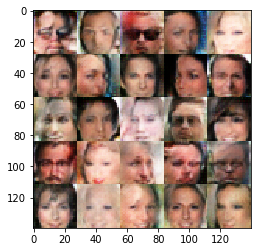

Epoch 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.6266
Epoch 1/1... Discriminator Loss: 1.3472... Generator Loss: 0.8146
Epoch 1/1... Discriminator Loss: 1.3435... Generator Loss: 0.6927
Epoch 1/1... Discriminator Loss: 1.2170... Generator Loss: 0.7253
Epoch 1/1... Discriminator Loss: 1.4151... Generator Loss: 0.8076
Epoch 1/1... Discriminator Loss: 1.2702... Generator Loss: 0.7465
Epoch 1/1... Discriminator Loss: 1.3398... Generator Loss: 0.7290
Epoch 1/1... Discriminator Loss: 1.4259... Generator Loss: 0.7268
Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.8037
Epoch 1/1... Discriminator Loss: 1.3905... Generator Loss: 0.7135


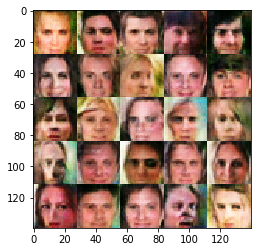

Epoch 1/1... Discriminator Loss: 1.3338... Generator Loss: 0.7696
Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.7812
Epoch 1/1... Discriminator Loss: 1.3524... Generator Loss: 0.8064
Epoch 1/1... Discriminator Loss: 1.3281... Generator Loss: 0.8572
Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 0.7620
Epoch 1/1... Discriminator Loss: 1.1674... Generator Loss: 0.7169
Epoch 1/1... Discriminator Loss: 1.4372... Generator Loss: 0.6888
Epoch 1/1... Discriminator Loss: 1.3120... Generator Loss: 0.8249
Epoch 1/1... Discriminator Loss: 1.3398... Generator Loss: 0.8760
Epoch 1/1... Discriminator Loss: 1.4355... Generator Loss: 0.5316


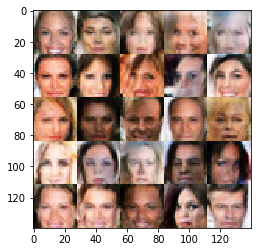

Epoch 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.7728
Epoch 1/1... Discriminator Loss: 1.3839... Generator Loss: 0.7667
Epoch 1/1... Discriminator Loss: 1.3028... Generator Loss: 0.5966
Epoch 1/1... Discriminator Loss: 1.2927... Generator Loss: 0.8103
Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.6436
Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.7254
Epoch 1/1... Discriminator Loss: 1.3224... Generator Loss: 0.7805
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.8322
Epoch 1/1... Discriminator Loss: 1.3615... Generator Loss: 0.6836
Epoch 1/1... Discriminator Loss: 1.3929... Generator Loss: 0.7264


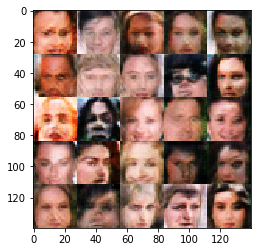

Epoch 1/1... Discriminator Loss: 1.2832... Generator Loss: 0.7760
Epoch 1/1... Discriminator Loss: 1.1554... Generator Loss: 0.8855
Epoch 1/1... Discriminator Loss: 1.1525... Generator Loss: 0.7217
Epoch 1/1... Discriminator Loss: 1.2800... Generator Loss: 0.7985
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.7265
Epoch 1/1... Discriminator Loss: 1.3387... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 1.3885... Generator Loss: 0.7552
Epoch 1/1... Discriminator Loss: 1.3977... Generator Loss: 0.7026
Epoch 1/1... Discriminator Loss: 1.4699... Generator Loss: 0.6078
Epoch 1/1... Discriminator Loss: 1.3655... Generator Loss: 0.7025


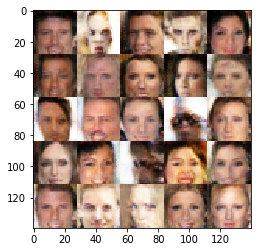

Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.4021... Generator Loss: 0.7917
Epoch 1/1... Discriminator Loss: 1.3215... Generator Loss: 0.8516
Epoch 1/1... Discriminator Loss: 1.3983... Generator Loss: 0.7721
Epoch 1/1... Discriminator Loss: 1.3635... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.2909... Generator Loss: 0.7448
Epoch 1/1... Discriminator Loss: 1.2243... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.6380
Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.7408


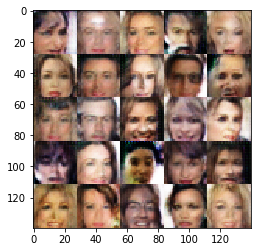

Epoch 1/1... Discriminator Loss: 1.2333... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.3344... Generator Loss: 0.9942
Epoch 1/1... Discriminator Loss: 1.3397... Generator Loss: 0.8871
Epoch 1/1... Discriminator Loss: 1.3084... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.4240... Generator Loss: 0.6373
Epoch 1/1... Discriminator Loss: 1.3161... Generator Loss: 0.9002
Epoch 1/1... Discriminator Loss: 1.1889... Generator Loss: 0.8390
Epoch 1/1... Discriminator Loss: 1.1877... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.2672... Generator Loss: 0.7014
Epoch 1/1... Discriminator Loss: 1.3925... Generator Loss: 0.7924


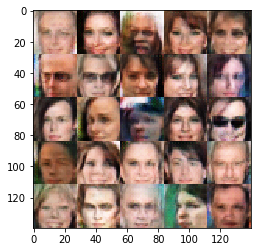

Epoch 1/1... Discriminator Loss: 1.3923... Generator Loss: 0.6794
Epoch 1/1... Discriminator Loss: 1.3133... Generator Loss: 0.8948
Epoch 1/1... Discriminator Loss: 1.4004... Generator Loss: 0.7686
Epoch 1/1... Discriminator Loss: 1.3310... Generator Loss: 0.7760
Epoch 1/1... Discriminator Loss: 1.4821... Generator Loss: 0.7095
Epoch 1/1... Discriminator Loss: 1.2092... Generator Loss: 0.7899
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.7476
Epoch 1/1... Discriminator Loss: 1.3527... Generator Loss: 0.7926
Epoch 1/1... Discriminator Loss: 1.4577... Generator Loss: 0.7813
Epoch 1/1... Discriminator Loss: 1.3285... Generator Loss: 0.6204


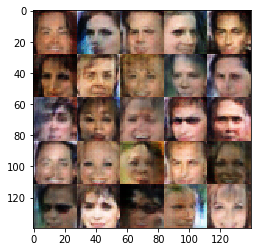

Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.7645
Epoch 1/1... Discriminator Loss: 1.2459... Generator Loss: 0.8690
Epoch 1/1... Discriminator Loss: 1.3188... Generator Loss: 0.7525
Epoch 1/1... Discriminator Loss: 1.3029... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.2242... Generator Loss: 0.6874
Epoch 1/1... Discriminator Loss: 1.2822... Generator Loss: 0.8576
Epoch 1/1... Discriminator Loss: 1.2618... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.2437... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 1.3477... Generator Loss: 0.8181
Epoch 1/1... Discriminator Loss: 1.4793... Generator Loss: 0.6871


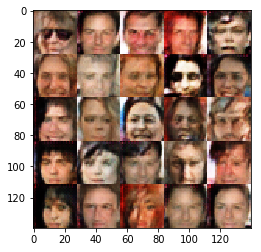

Epoch 1/1... Discriminator Loss: 1.2875... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.2973... Generator Loss: 0.7575
Epoch 1/1... Discriminator Loss: 1.3872... Generator Loss: 0.7452
Epoch 1/1... Discriminator Loss: 1.4510... Generator Loss: 0.6521
Epoch 1/1... Discriminator Loss: 1.3419... Generator Loss: 0.8105
Epoch 1/1... Discriminator Loss: 1.4304... Generator Loss: 0.8307
Epoch 1/1... Discriminator Loss: 1.2872... Generator Loss: 0.8154
Epoch 1/1... Discriminator Loss: 1.3710... Generator Loss: 0.7323
Epoch 1/1... Discriminator Loss: 1.1980... Generator Loss: 0.7739
Epoch 1/1... Discriminator Loss: 1.3822... Generator Loss: 0.6934


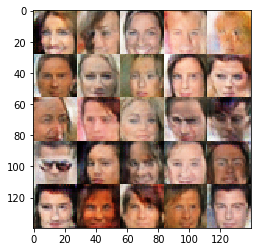

Epoch 1/1... Discriminator Loss: 1.3225... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.2852... Generator Loss: 0.8577
Epoch 1/1... Discriminator Loss: 1.2113... Generator Loss: 1.0083
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 0.8294
Epoch 1/1... Discriminator Loss: 1.3185... Generator Loss: 0.8653
Epoch 1/1... Discriminator Loss: 1.3848... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.3223... Generator Loss: 0.8606
Epoch 1/1... Discriminator Loss: 1.4227... Generator Loss: 0.6618
Epoch 1/1... Discriminator Loss: 1.3183... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.1834... Generator Loss: 0.7402


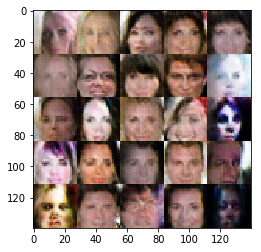

Epoch 1/1... Discriminator Loss: 1.4000... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.6679
Epoch 1/1... Discriminator Loss: 1.5750... Generator Loss: 0.5736
Epoch 1/1... Discriminator Loss: 1.2796... Generator Loss: 0.8056
Epoch 1/1... Discriminator Loss: 1.3364... Generator Loss: 0.6796
Epoch 1/1... Discriminator Loss: 1.3587... Generator Loss: 0.6993
Epoch 1/1... Discriminator Loss: 1.3938... Generator Loss: 0.9640
Epoch 1/1... Discriminator Loss: 1.3987... Generator Loss: 0.7469
Epoch 1/1... Discriminator Loss: 1.3101... Generator Loss: 0.8216
Epoch 1/1... Discriminator Loss: 1.4675... Generator Loss: 0.6970


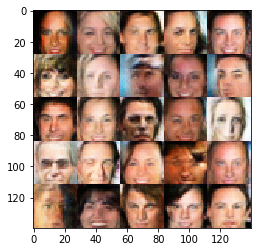

Epoch 1/1... Discriminator Loss: 1.2945... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.3938... Generator Loss: 0.6990
Epoch 1/1... Discriminator Loss: 1.2781... Generator Loss: 0.6978
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.8040
Epoch 1/1... Discriminator Loss: 1.2767... Generator Loss: 0.8032
Epoch 1/1... Discriminator Loss: 1.3401... Generator Loss: 0.7429
Epoch 1/1... Discriminator Loss: 1.1985... Generator Loss: 0.8205
Epoch 1/1... Discriminator Loss: 1.4703... Generator Loss: 0.6001
Epoch 1/1... Discriminator Loss: 1.3195... Generator Loss: 0.8143
Epoch 1/1... Discriminator Loss: 1.3305... Generator Loss: 0.7568


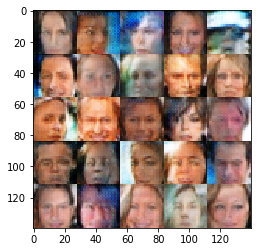

Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.6843
Epoch 1/1... Discriminator Loss: 1.1301... Generator Loss: 0.7004
Epoch 1/1... Discriminator Loss: 1.2491... Generator Loss: 0.7590
Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.7063
Epoch 1/1... Discriminator Loss: 1.2240... Generator Loss: 0.8336
Epoch 1/1... Discriminator Loss: 1.3019... Generator Loss: 0.8420
Epoch 1/1... Discriminator Loss: 1.4076... Generator Loss: 0.6695
Epoch 1/1... Discriminator Loss: 1.3670... Generator Loss: 0.7754
Epoch 1/1... Discriminator Loss: 1.3702... Generator Loss: 0.8516
Epoch 1/1... Discriminator Loss: 1.3176... Generator Loss: 0.7487


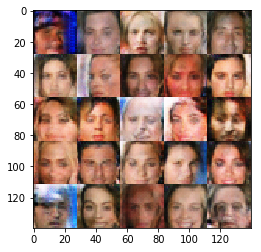

Epoch 1/1... Discriminator Loss: 1.2231... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.4332... Generator Loss: 0.6838
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 0.9184
Epoch 1/1... Discriminator Loss: 1.4335... Generator Loss: 0.6747
Epoch 1/1... Discriminator Loss: 1.3665... Generator Loss: 0.7556
Epoch 1/1... Discriminator Loss: 1.2383... Generator Loss: 0.6875
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 1.2303... Generator Loss: 0.7545
Epoch 1/1... Discriminator Loss: 1.3753... Generator Loss: 0.7572
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.8504


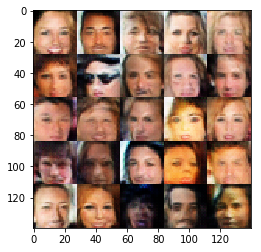

Epoch 1/1... Discriminator Loss: 1.3347... Generator Loss: 0.8556
Epoch 1/1... Discriminator Loss: 1.3593... Generator Loss: 0.5674
Epoch 1/1... Discriminator Loss: 1.3531... Generator Loss: 0.9008
Epoch 1/1... Discriminator Loss: 1.1745... Generator Loss: 0.8172
Epoch 1/1... Discriminator Loss: 1.3387... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.3481... Generator Loss: 0.7847
Epoch 1/1... Discriminator Loss: 1.3994... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.6668
Epoch 1/1... Discriminator Loss: 1.2073... Generator Loss: 0.9802
Epoch 1/1... Discriminator Loss: 1.3316... Generator Loss: 0.8211


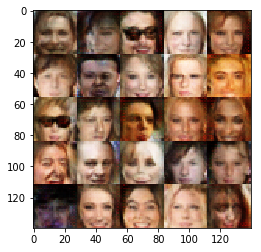

Epoch 1/1... Discriminator Loss: 1.3573... Generator Loss: 0.7694
Epoch 1/1... Discriminator Loss: 1.3292... Generator Loss: 0.8026
Epoch 1/1... Discriminator Loss: 1.3197... Generator Loss: 0.7998
Epoch 1/1... Discriminator Loss: 1.2653... Generator Loss: 0.7916
Epoch 1/1... Discriminator Loss: 1.4297... Generator Loss: 0.7902
Epoch 1/1... Discriminator Loss: 1.2625... Generator Loss: 0.8083
Epoch 1/1... Discriminator Loss: 1.3608... Generator Loss: 0.7514
Epoch 1/1... Discriminator Loss: 1.4450... Generator Loss: 0.6019
Epoch 1/1... Discriminator Loss: 1.1939... Generator Loss: 0.7707
Epoch 1/1... Discriminator Loss: 1.4526... Generator Loss: 0.7179


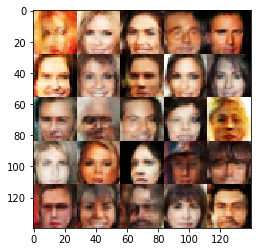

Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.7810
Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.7637
Epoch 1/1... Discriminator Loss: 1.3718... Generator Loss: 0.7941
Epoch 1/1... Discriminator Loss: 1.3646... Generator Loss: 0.8580
Epoch 1/1... Discriminator Loss: 1.3853... Generator Loss: 0.6987
Epoch 1/1... Discriminator Loss: 1.4273... Generator Loss: 0.7702
Epoch 1/1... Discriminator Loss: 1.2911... Generator Loss: 0.8118
Epoch 1/1... Discriminator Loss: 1.3501... Generator Loss: 0.7321
Epoch 1/1... Discriminator Loss: 1.2574... Generator Loss: 0.7414
Epoch 1/1... Discriminator Loss: 1.1559... Generator Loss: 0.8242


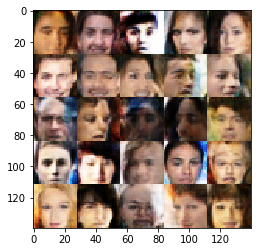

Epoch 1/1... Discriminator Loss: 1.3425... Generator Loss: 0.6399
Epoch 1/1... Discriminator Loss: 1.3509... Generator Loss: 0.7392
Epoch 1/1... Discriminator Loss: 1.2137... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.1141... Generator Loss: 0.8206
Epoch 1/1... Discriminator Loss: 1.2684... Generator Loss: 0.7398
Epoch 1/1... Discriminator Loss: 1.3782... Generator Loss: 0.8366
Epoch 1/1... Discriminator Loss: 1.1333... Generator Loss: 0.7521
Epoch 1/1... Discriminator Loss: 1.3159... Generator Loss: 0.8368
Epoch 1/1... Discriminator Loss: 1.2840... Generator Loss: 0.7981
Epoch 1/1... Discriminator Loss: 1.3539... Generator Loss: 0.7363


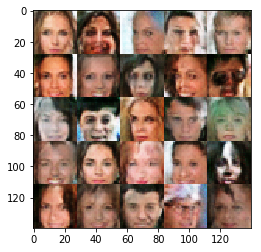

Epoch 1/1... Discriminator Loss: 1.3465... Generator Loss: 0.7420
Epoch 1/1... Discriminator Loss: 1.2566... Generator Loss: 0.7829
Epoch 1/1... Discriminator Loss: 1.2931... Generator Loss: 0.9275
Epoch 1/1... Discriminator Loss: 1.3901... Generator Loss: 0.7202
Epoch 1/1... Discriminator Loss: 1.2549... Generator Loss: 0.6280
Epoch 1/1... Discriminator Loss: 1.4453... Generator Loss: 0.6988
Epoch 1/1... Discriminator Loss: 1.2859... Generator Loss: 0.8062
Epoch 1/1... Discriminator Loss: 1.2510... Generator Loss: 0.8791
Epoch 1/1... Discriminator Loss: 1.4016... Generator Loss: 0.7475
Epoch 1/1... Discriminator Loss: 1.2813... Generator Loss: 0.7557


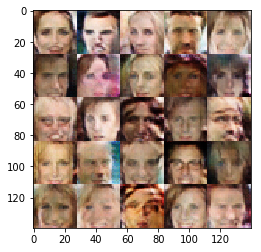

Epoch 1/1... Discriminator Loss: 1.2910... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.7022
Epoch 1/1... Discriminator Loss: 1.3547... Generator Loss: 0.7576
Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.7220
Epoch 1/1... Discriminator Loss: 1.2551... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 1.3611... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.4292... Generator Loss: 0.6601
Epoch 1/1... Discriminator Loss: 1.3269... Generator Loss: 0.6330
Epoch 1/1... Discriminator Loss: 1.3531... Generator Loss: 0.7946
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.6312


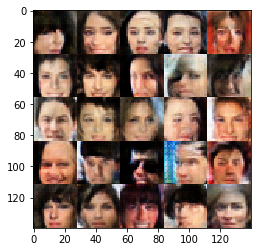

Epoch 1/1... Discriminator Loss: 1.3284... Generator Loss: 0.8512
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.7303
Epoch 1/1... Discriminator Loss: 1.3463... Generator Loss: 0.7402
Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 0.6669
Epoch 1/1... Discriminator Loss: 1.1932... Generator Loss: 0.7898
Epoch 1/1... Discriminator Loss: 1.2451... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.5067... Generator Loss: 0.5489
Epoch 1/1... Discriminator Loss: 1.4466... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 1.4291... Generator Loss: 0.7865
Epoch 1/1... Discriminator Loss: 1.2445... Generator Loss: 0.8054


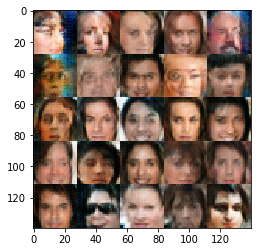

Epoch 1/1... Discriminator Loss: 1.3407... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.2638... Generator Loss: 0.7797
Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 1.3322... Generator Loss: 0.7444
Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.8453
Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.2536... Generator Loss: 0.7660
Epoch 1/1... Discriminator Loss: 1.4334... Generator Loss: 0.6662
Epoch 1/1... Discriminator Loss: 1.4911... Generator Loss: 0.5854
Epoch 1/1... Discriminator Loss: 1.3680... Generator Loss: 0.7261


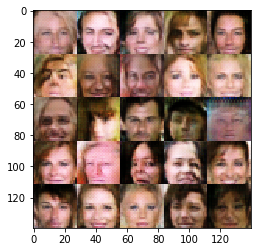

Epoch 1/1... Discriminator Loss: 1.2323... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.3764... Generator Loss: 0.6545
Epoch 1/1... Discriminator Loss: 1.2883... Generator Loss: 0.7304
Epoch 1/1... Discriminator Loss: 1.3172... Generator Loss: 0.8888
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.7372
Epoch 1/1... Discriminator Loss: 1.3574... Generator Loss: 0.7536
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.7688
Epoch 1/1... Discriminator Loss: 1.1233... Generator Loss: 0.7901
Epoch 1/1... Discriminator Loss: 1.3280... Generator Loss: 0.8381
Epoch 1/1... Discriminator Loss: 1.4124... Generator Loss: 0.7930


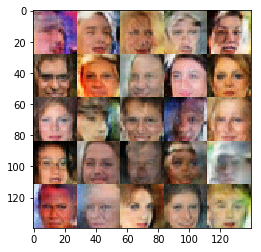

Epoch 1/1... Discriminator Loss: 1.3371... Generator Loss: 0.7151
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.6240
Epoch 1/1... Discriminator Loss: 1.3987... Generator Loss: 0.7755
Epoch 1/1... Discriminator Loss: 1.3607... Generator Loss: 0.7494
Epoch 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.7859
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.7101
Epoch 1/1... Discriminator Loss: 1.2525... Generator Loss: 0.7204
Epoch 1/1... Discriminator Loss: 1.4064... Generator Loss: 0.7624
Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.3248... Generator Loss: 0.7369


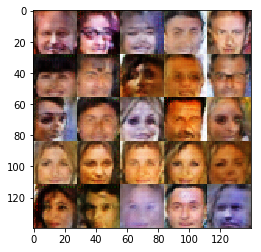

Epoch 1/1... Discriminator Loss: 1.2984... Generator Loss: 0.7325
Epoch 1/1... Discriminator Loss: 1.3980... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.2188... Generator Loss: 0.8188
Epoch 1/1... Discriminator Loss: 1.3392... Generator Loss: 0.7779
Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.7622
Epoch 1/1... Discriminator Loss: 1.4866... Generator Loss: 0.5750
Epoch 1/1... Discriminator Loss: 1.4040... Generator Loss: 0.7426
Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 0.7239
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.7480
Epoch 1/1... Discriminator Loss: 1.1833... Generator Loss: 0.7521


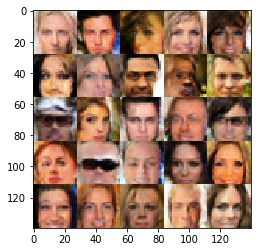

Epoch 1/1... Discriminator Loss: 1.4344... Generator Loss: 0.7008
Epoch 1/1... Discriminator Loss: 1.4586... Generator Loss: 0.7902
Epoch 1/1... Discriminator Loss: 1.3818... Generator Loss: 0.7114
Epoch 1/1... Discriminator Loss: 1.4098... Generator Loss: 0.6915
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.6885
Epoch 1/1... Discriminator Loss: 1.1748... Generator Loss: 0.7698
Epoch 1/1... Discriminator Loss: 1.2973... Generator Loss: 0.8385
Epoch 1/1... Discriminator Loss: 1.2989... Generator Loss: 0.7411
Epoch 1/1... Discriminator Loss: 1.3684... Generator Loss: 0.7108
Epoch 1/1... Discriminator Loss: 1.3273... Generator Loss: 0.7878


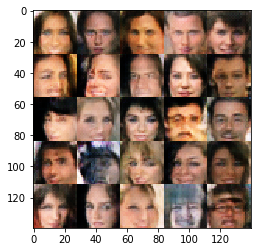

Epoch 1/1... Discriminator Loss: 1.2883... Generator Loss: 0.7364
Epoch 1/1... Discriminator Loss: 1.3528... Generator Loss: 0.7887
Epoch 1/1... Discriminator Loss: 1.3477... Generator Loss: 0.7387
Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 1.3361... Generator Loss: 0.7478
Epoch 1/1... Discriminator Loss: 1.2837... Generator Loss: 0.7748
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.7138
Epoch 1/1... Discriminator Loss: 1.2484... Generator Loss: 0.7501
Epoch 1/1... Discriminator Loss: 1.2572... Generator Loss: 0.7088
Epoch 1/1... Discriminator Loss: 1.5252... Generator Loss: 0.6299


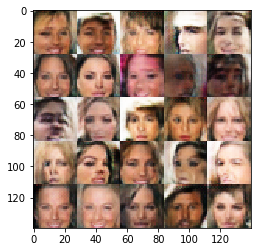

Epoch 1/1... Discriminator Loss: 1.2943... Generator Loss: 0.6933
Epoch 1/1... Discriminator Loss: 1.1577... Generator Loss: 0.7926
Epoch 1/1... Discriminator Loss: 1.3486... Generator Loss: 0.7698
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.7464
Epoch 1/1... Discriminator Loss: 1.3136... Generator Loss: 0.8054
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 0.7313
Epoch 1/1... Discriminator Loss: 1.1680... Generator Loss: 0.7456
Epoch 1/1... Discriminator Loss: 1.4605... Generator Loss: 0.6614
Epoch 1/1... Discriminator Loss: 1.3306... Generator Loss: 0.9139
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.7793


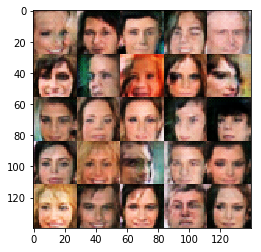

Epoch 1/1... Discriminator Loss: 1.3679... Generator Loss: 0.7286
Epoch 1/1... Discriminator Loss: 1.3584... Generator Loss: 0.9180
Epoch 1/1... Discriminator Loss: 1.3843... Generator Loss: 0.7307
Epoch 1/1... Discriminator Loss: 1.2293... Generator Loss: 0.7206
Epoch 1/1... Discriminator Loss: 1.3429... Generator Loss: 0.6929
Epoch 1/1... Discriminator Loss: 1.3905... Generator Loss: 0.7721


In [74]:
batch_size = 16
z_dim = 100
learning_rate = 0.0009
beta1 = .3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.